Connected to Neural_Response_Variability (Python 3.12.1)

<ipython-input-1-9dcdb7294c38>:161: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(2,1)


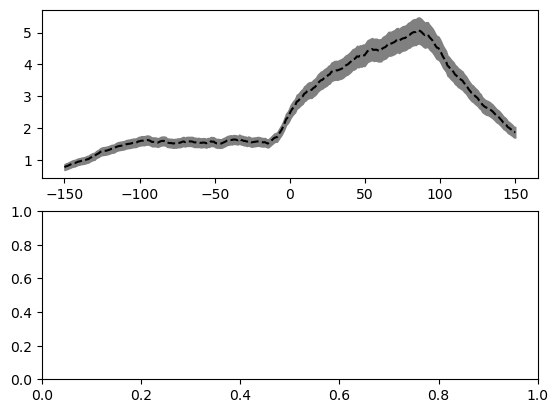

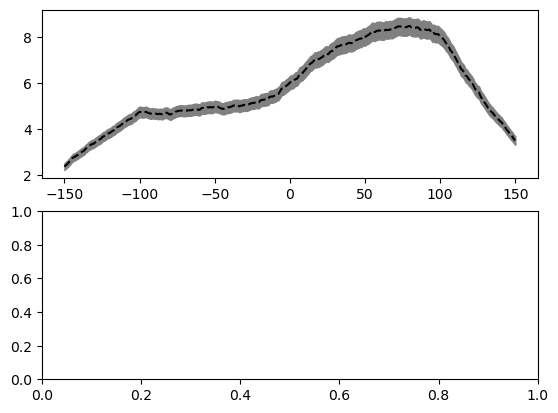

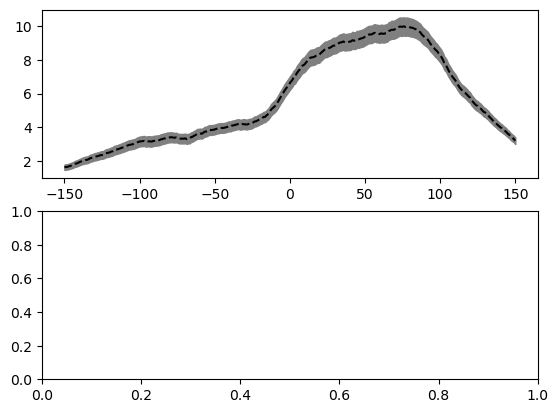

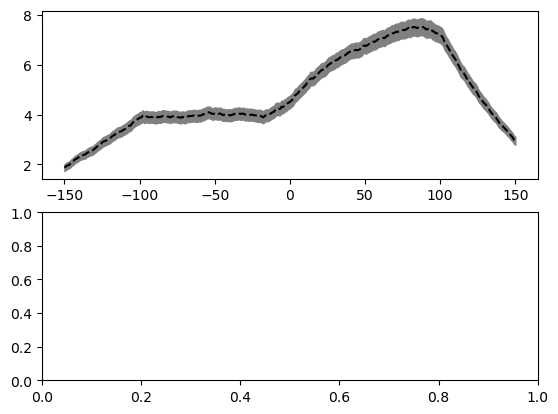

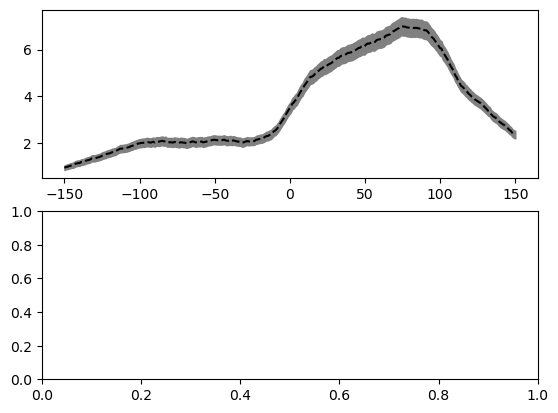

...

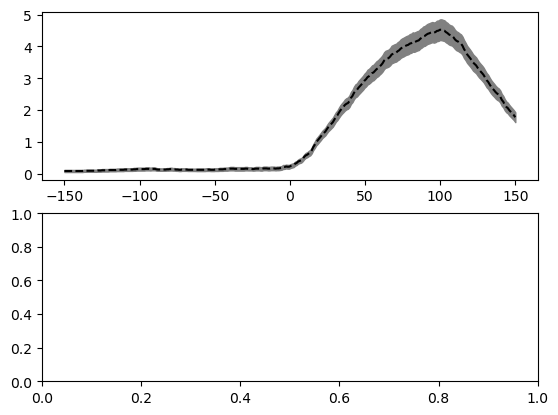

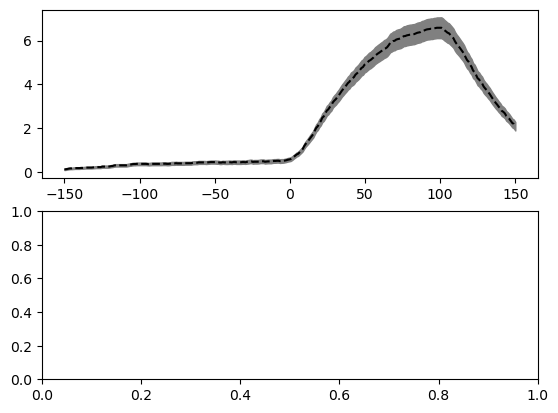

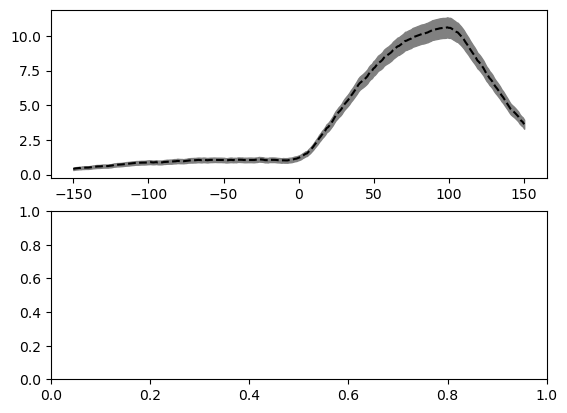

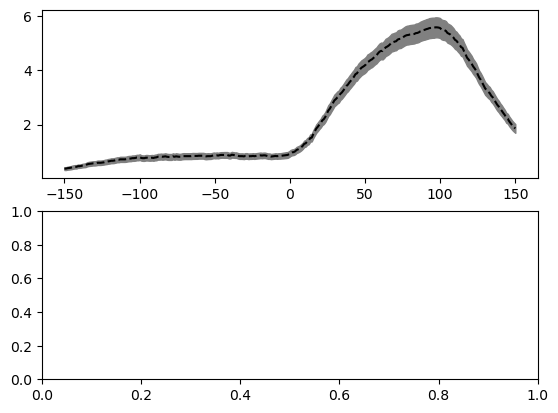

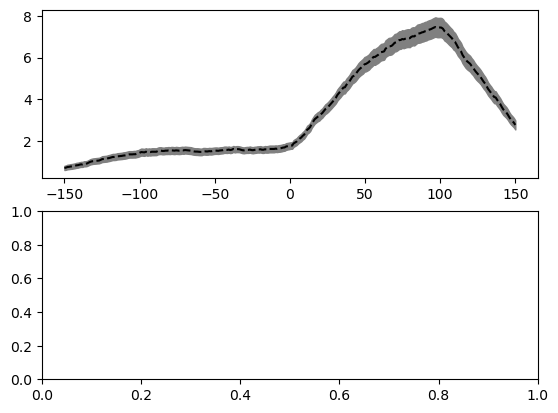

In [ ]:
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from scipy.signal import detrend

# Load files
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
trial_DF_path = utils.getFilePath(windowTitle="trials_DF_Stimulus", filetypes=[('Trials_Stimulus csv file', '*.csv')])
pupilFullPath = utils.getFilePath(windowTitle="Pupil diameter data",filetypes=[("Numpy array","*.npy")])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
trialDF = pd.read_csv(trial_DF_path)
pupil_diameter = np.load(pupilFullPath)

binFullPath = utils.getFilePath(windowTitle="Binary nidq file",filetypes=[("NIdq binary","*.bin")]) # type: ignore
meta  = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)

# Get spike times for each cluster
spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def meanvar_PSTH(data,count_window=100,style='same',return_bootdstrs=False,nboots=1000):
    data = data > 0
    if style == 'valid':
        mean_timevector = np.nan*np.ones((data.shape[1] - count_window + 1))
        vari_timevector = np.nan*np.ones((data.shape[1] - count_window + 1))
        tmp  = np.ones((data.shape[0], data.shape[1] - count_window + 1))
    else:
        mean_timevector = np.nan*np.ones((data.shape[1]))
        vari_timevector = np.nan*np.ones((data.shape[1]))
        tmp  = np.ones((data.shape[0], data.shape[1]))
            
    for i in range(data.shape[0]):
        # compute spike counts in sliding window
        tmp[i,:] = np.convolve(data[i,:],np.ones(count_window,),style)
            
    vari_timevector = np.var(tmp,axis=0)
    mean_timevector = np.mean(tmp, axis=0)
    
    if return_bootdstrs:
        boot_inds = np.random.choice(tmp.shape[0],(tmp.shape[0],nboots))
        mean_timevector_booted = np.nan * np.ones((nboots,tmp.shape[1]))
        vari_timevector_booted = np.nan * np.ones((nboots,tmp.shape[1]))
        for i in range(nboots):
            mean_timevector_booted[i,:] = np.mean(tmp[boot_inds[:,i],:],axis=0)
            vari_timevector_booted[i,:] = np.var(tmp[boot_inds[:,i],:],axis=0)

    else:
        mean_timevector_booted = np.array([])
        vari_timevector_booted = np.array([])
            
    #
    return mean_timevector, vari_timevector, tmp, mean_timevector_booted, vari_timevector_booted

""" def plot_psth(data_matrix, time_bins, cluster_index, mean_firing_rate):
    fig, ax = plt.subplots(figsize=(15, 10))
    
    # Plot PSTH for each trial as event plot
    for trial_idx in range(data_matrix.shape[0]):
        spike_times = time_bins[data_matrix[trial_idx, :] > 0]
        ax.eventplot(spike_times, lineoffsets=trial_idx + 1, colors='black')
    
    ax.set_title(f'PSTH - Cluster {cluster_index} (Mean Firing Rate: {mean_firing_rate:.2f} spikes/sec)')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Trial')
    
    plt.tight_layout()
    plt.show() """

def return_psth(Y, trialDF, bin_size=0.001, pre_window=0.150, post_window=0.150):
    
    num_bins = int((pre_window + post_window) / bin_size) 
    data_matrix = np.zeros((len(trialDF), num_bins))    

    for trial_idx, row in trialDF.iterrows():
        stimstart = row['stimstart']

        # Define time window around stimstart
        start_time = stimstart - pre_window
        stop_time = stimstart + post_window

        # Filter spike times within the trial window
        spikes_in_window = Y[(Y >= start_time) & (Y <= stop_time)]

        # Bin the spikes
        bin_counts, _ = np.histogram(spikes_in_window, bins=np.linspace(start_time, stop_time, num_bins+1))
        data_matrix[trial_idx, :] = bin_counts

    
    mean_timevector, vari_timevector, tmp, mean_timevector_booted, vari_timevector_booted = meanvar_PSTH(data_matrix,count_window=100,style='same',return_bootdstrs=True,nboots=1000)
    t = np.linspace(start_time, stop_time, num_bins)
    return mean_timevector, vari_timevector, mean_timevector_booted, vari_timevector_booted,t

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
                    
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_count_bsl = len(spikes_in_bsl)
        spkC_evk[index] = spike_count_trial
        spkC_bsl[index] = spike_count_bsl

    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample  = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)


def get_pupil_Diameter(stimulusDF, pupil_diameter,sRate):

    # ad hoc cleaning needed for 2024-04-11 data
    #pupil_diameter[0:80000] = -3900.0
    pupil_diameter = detrend(pupil_diameter)
    pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
    pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
    pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)
    
    #inds_low = np.where((pupil_trials > 0.25) & (pupil_trials < 0.35))[0]
    pup_median = np.median(pupil_trials)
    inds_low = np.where(pupil_trials < pup_median)[0]
    inds_high = np.where(pupil_trials > pup_median)[0]

    return inds_low, inds_high


good_clusters = []
spkC = {}
BSL = {}
spkC_zscored = {}

inds_low, inds_high = get_pupil_Diameter(trialDF, pupil_diameter,sRate)

for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]    

    spkC[i],BSL[i] = get_spike_counts(Y, trialDF)    
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        # Call with trialDF_low
        mean_timevector, vari_timevector, mean_timevector_booted, vari_timevector_booted,t = return_psth(Y, trialDF)
        # Call with trialDF_high
        #mean_timevector, vari_timevector, mean_timevector_booted, vari_timevector_booted,t = return_psth(Y, trialDF)

        fig,ax = plt.subplots(2,1)
        t = np.linspace(-150,150,300)
        psth_low  = mean_timevector - np.std(mean_timevector_booted,axis=0)
        psth_high = mean_timevector + np.std(mean_timevector_booted,axis=0)
        ax[0].fill_between(t,psth_low,psth_high,color='grey')
        ax[0].plot(t,mean_timevector,'k--')        
        #ax[1].plot(t,fano_factor,'r-')

<ipython-input-5-779bf8169ae8>:161: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(2,1)


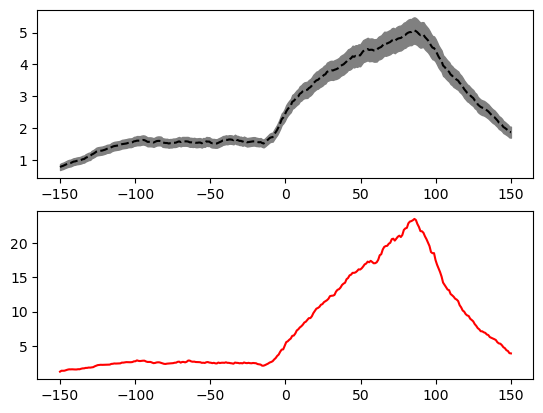

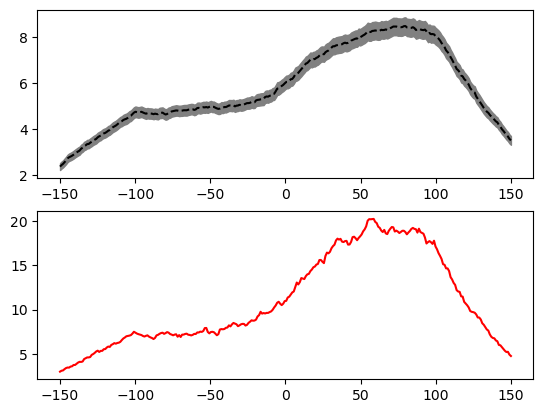

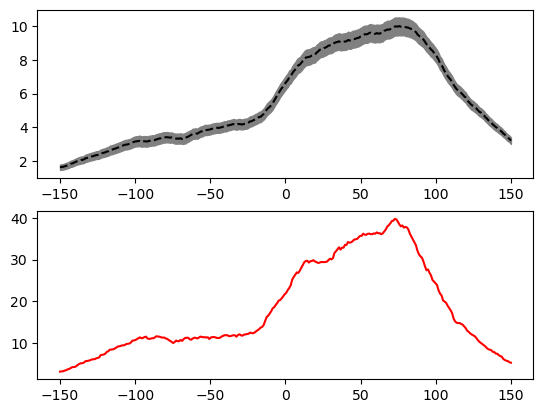

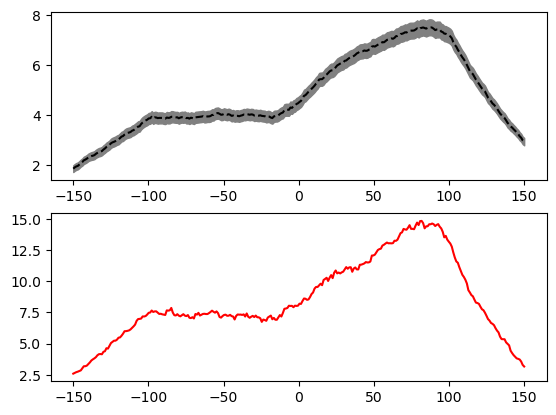

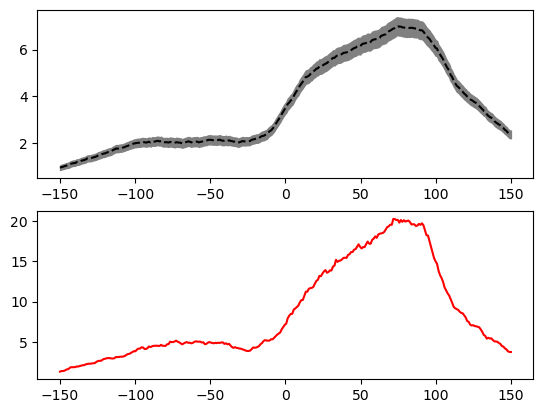

...

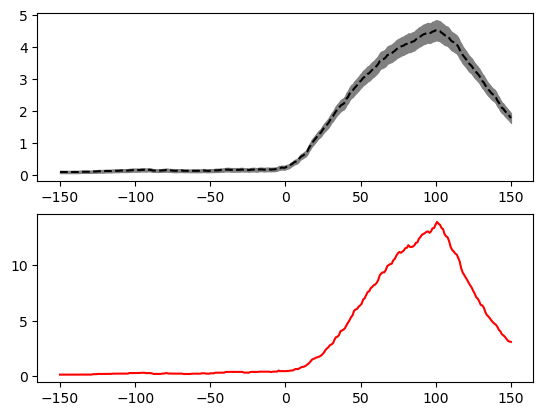

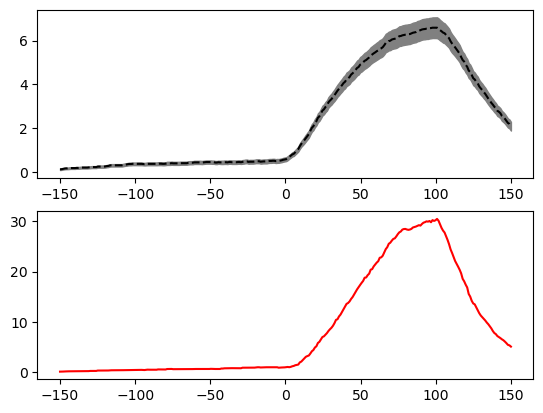

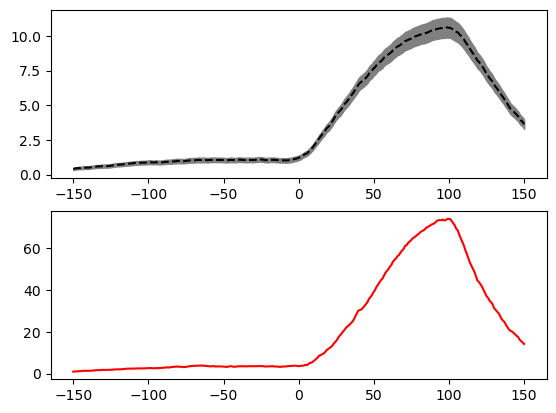

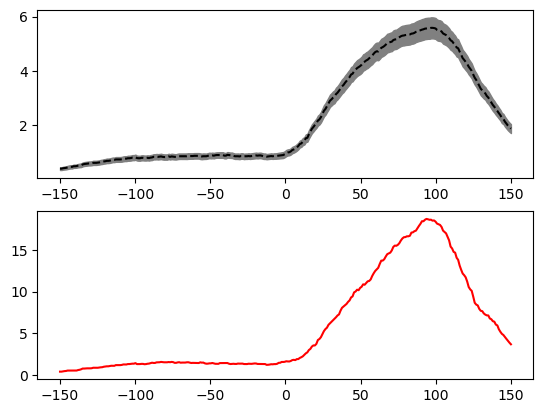

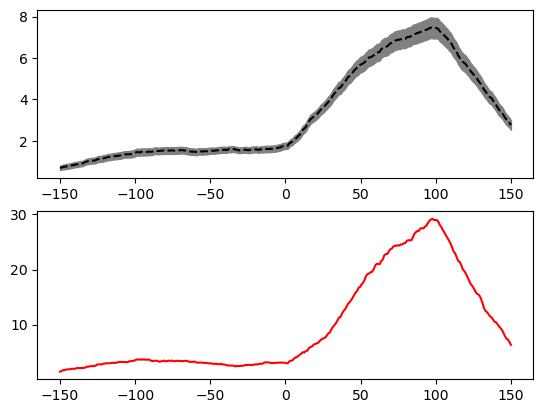

In [ ]:
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from scipy.signal import detrend

# Load files
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
trial_DF_path = utils.getFilePath(windowTitle="trials_DF_Stimulus", filetypes=[('Trials_Stimulus csv file', '*.csv')])
pupilFullPath = utils.getFilePath(windowTitle="Pupil diameter data",filetypes=[("Numpy array","*.npy")])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
trialDF = pd.read_csv(trial_DF_path)
pupil_diameter = np.load(pupilFullPath)

binFullPath = utils.getFilePath(windowTitle="Binary nidq file",filetypes=[("NIdq binary","*.bin")]) # type: ignore
meta  = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)

# Get spike times for each cluster
spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def meanvar_PSTH(data,count_window=100,style='same',return_bootdstrs=False,nboots=1000):
    data = data > 0
    if style == 'valid':
        mean_timevector = np.nan*np.ones((data.shape[1] - count_window + 1))
        vari_timevector = np.nan*np.ones((data.shape[1] - count_window + 1))
        tmp  = np.ones((data.shape[0], data.shape[1] - count_window + 1))
    else:
        mean_timevector = np.nan*np.ones((data.shape[1]))
        vari_timevector = np.nan*np.ones((data.shape[1]))
        tmp  = np.ones((data.shape[0], data.shape[1]))
            
    for i in range(data.shape[0]):
        # compute spike counts in sliding window
        tmp[i,:] = np.convolve(data[i,:],np.ones(count_window,),style)
            
    vari_timevector = np.var(tmp,axis=0)
    mean_timevector = np.mean(tmp, axis=0)
    
    if return_bootdstrs:
        boot_inds = np.random.choice(tmp.shape[0],(tmp.shape[0],nboots))
        mean_timevector_booted = np.nan * np.ones((nboots,tmp.shape[1]))
        vari_timevector_booted = np.nan * np.ones((nboots,tmp.shape[1]))
        for i in range(nboots):
            mean_timevector_booted[i,:] = np.mean(tmp[boot_inds[:,i],:],axis=0)
            vari_timevector_booted[i,:] = np.var(tmp[boot_inds[:,i],:],axis=0)

    else:
        mean_timevector_booted = np.array([])
        vari_timevector_booted = np.array([])
            
    #
    return mean_timevector, vari_timevector, tmp, mean_timevector_booted, vari_timevector_booted

""" def plot_psth(data_matrix, time_bins, cluster_index, mean_firing_rate):
    fig, ax = plt.subplots(figsize=(15, 10))
    
    # Plot PSTH for each trial as event plot
    for trial_idx in range(data_matrix.shape[0]):
        spike_times = time_bins[data_matrix[trial_idx, :] > 0]
        ax.eventplot(spike_times, lineoffsets=trial_idx + 1, colors='black')
    
    ax.set_title(f'PSTH - Cluster {cluster_index} (Mean Firing Rate: {mean_firing_rate:.2f} spikes/sec)')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Trial')
    
    plt.tight_layout()
    plt.show() """

def return_psth(Y, trialDF, bin_size=0.001, pre_window=0.150, post_window=0.150):
    
    num_bins = int((pre_window + post_window) / bin_size) 
    data_matrix = np.zeros((len(trialDF), num_bins))    

    for trial_idx, row in trialDF.iterrows():
        stimstart = row['stimstart']

        # Define time window around stimstart
        start_time = stimstart - pre_window
        stop_time = stimstart + post_window

        # Filter spike times within the trial window
        spikes_in_window = Y[(Y >= start_time) & (Y <= stop_time)]

        # Bin the spikes
        bin_counts, _ = np.histogram(spikes_in_window, bins=np.linspace(start_time, stop_time, num_bins+1))
        data_matrix[trial_idx, :] = bin_counts

    
    mean_timevector, vari_timevector, tmp, mean_timevector_booted, vari_timevector_booted = meanvar_PSTH(data_matrix,count_window=100,style='same',return_bootdstrs=True,nboots=1000)
    t = np.linspace(start_time, stop_time, num_bins)
    return mean_timevector, vari_timevector, mean_timevector_booted, vari_timevector_booted,t

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
                    
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_count_bsl = len(spikes_in_bsl)
        spkC_evk[index] = spike_count_trial
        spkC_bsl[index] = spike_count_bsl

    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample  = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)


def get_pupil_Diameter(stimulusDF, pupil_diameter,sRate):

    # ad hoc cleaning needed for 2024-04-11 data
    #pupil_diameter[0:80000] = -3900.0
    pupil_diameter = detrend(pupil_diameter)
    pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
    pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
    pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)
    
    #inds_low = np.where((pupil_trials > 0.25) & (pupil_trials < 0.35))[0]
    pup_median = np.median(pupil_trials)
    inds_low = np.where(pupil_trials < pup_median)[0]
    inds_high = np.where(pupil_trials > pup_median)[0]

    return inds_low, inds_high


good_clusters = []
spkC = {}
BSL = {}
spkC_zscored = {}

inds_low, inds_high = get_pupil_Diameter(trialDF, pupil_diameter,sRate)

for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]    

    spkC[i],BSL[i] = get_spike_counts(Y, trialDF)    
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        # Call with trialDF_low
        mean_timevector, vari_timevector, mean_timevector_booted, vari_timevector_booted,t = return_psth(Y, trialDF)
        # Call with trialDF_high
        #mean_timevector, vari_timevector, mean_timevector_booted, vari_timevector_booted,t = return_psth(Y, trialDF)

        fig,ax = plt.subplots(2,1)
        t = np.linspace(-150,150,300)
        psth_low  = mean_timevector - np.std(mean_timevector_booted,axis=0)
        psth_high = mean_timevector + np.std(mean_timevector_booted,axis=0)
        ax[0].fill_between(t,psth_low,psth_high,color='grey')
        ax[0].plot(t,mean_timevector,'k--')      
        ax[1].plot(t, vari_timevector, 'r-')  
        #ax[1].plot(t,fano_factor,'r-')

<ipython-input-6-ca36b7b8f8c4>:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(2,1)


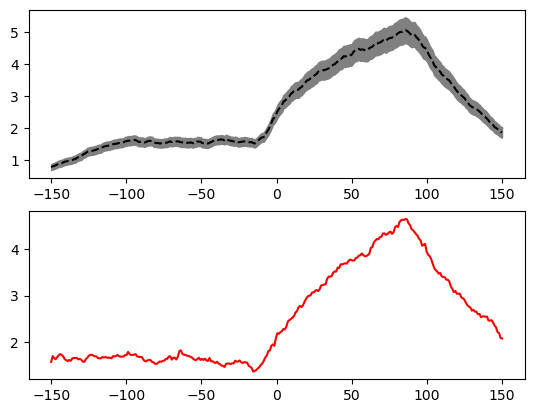

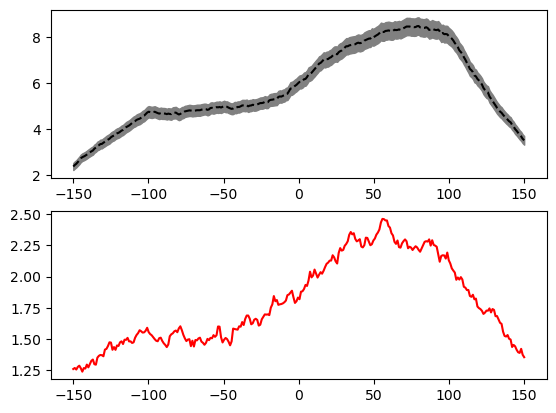

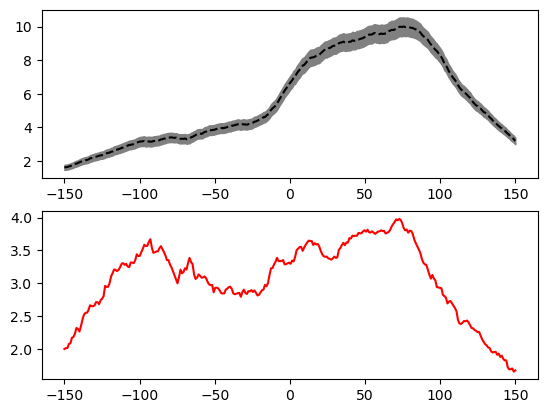

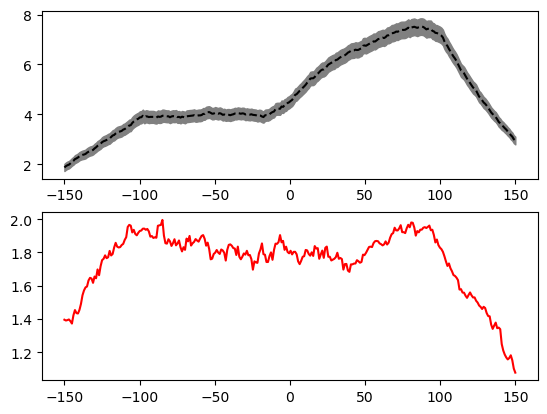

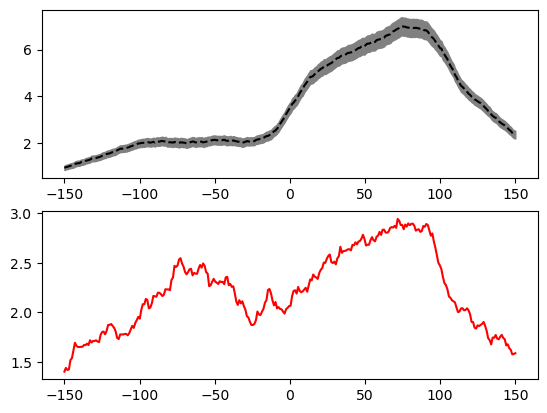

...

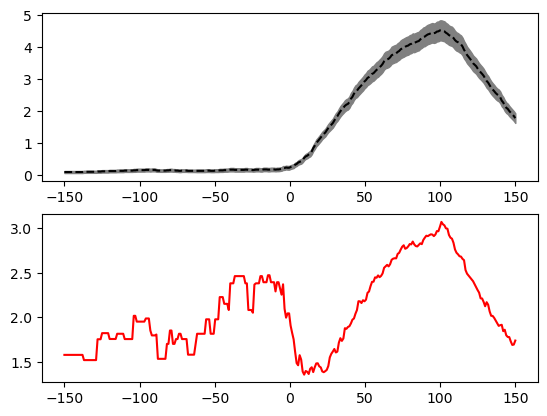

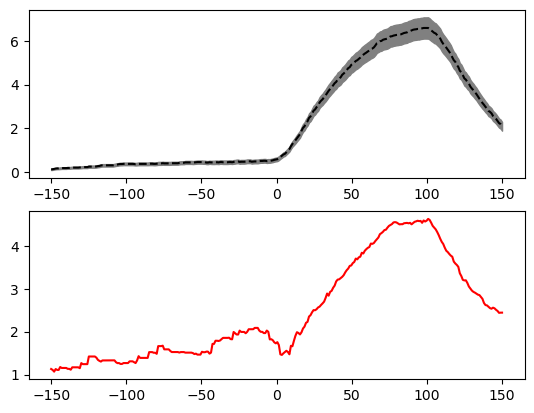

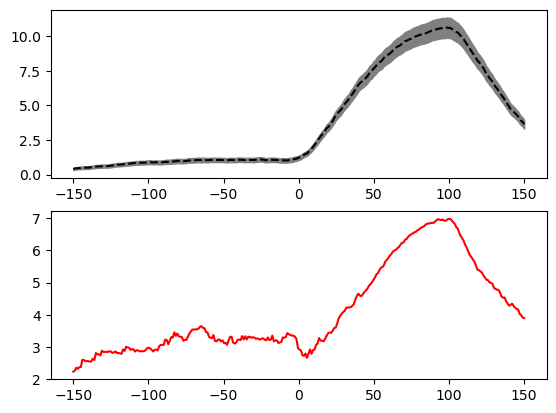

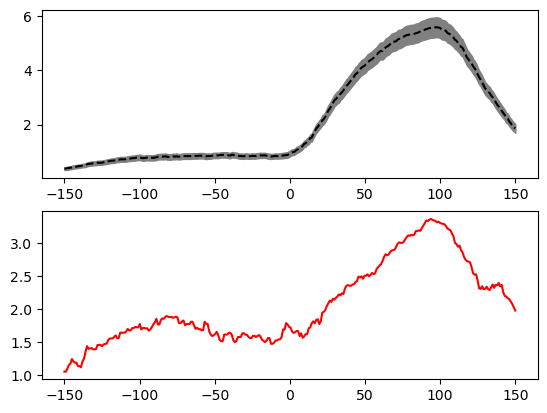

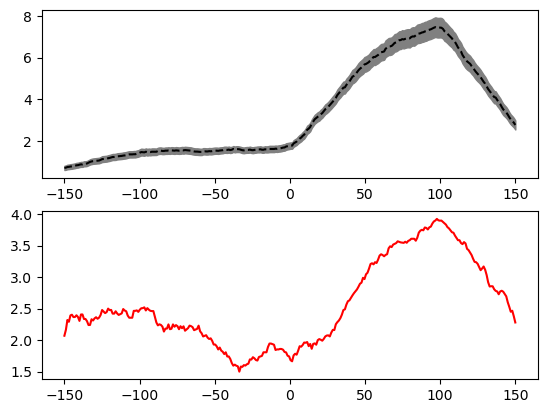

In [ ]:
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from scipy.signal import detrend

# Load files
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
trial_DF_path = utils.getFilePath(windowTitle="trials_DF_Stimulus", filetypes=[('Trials_Stimulus csv file', '*.csv')])
pupilFullPath = utils.getFilePath(windowTitle="Pupil diameter data",filetypes=[("Numpy array","*.npy")])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
trialDF = pd.read_csv(trial_DF_path)
pupil_diameter = np.load(pupilFullPath)

binFullPath = utils.getFilePath(windowTitle="Binary nidq file",filetypes=[("NIdq binary","*.bin")]) # type: ignore
meta  = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)

# Get spike times for each cluster
spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def meanvar_PSTH(data,count_window=100,style='same',return_bootdstrs=False,nboots=1000):
    data = data > 0
    if style == 'valid':
        mean_timevector = np.nan*np.ones((data.shape[1] - count_window + 1))
        vari_timevector = np.nan*np.ones((data.shape[1] - count_window + 1))
        tmp  = np.ones((data.shape[0], data.shape[1] - count_window + 1))
    else:
        mean_timevector = np.nan*np.ones((data.shape[1]))
        vari_timevector = np.nan*np.ones((data.shape[1]))
        tmp  = np.ones((data.shape[0], data.shape[1]))
            
    for i in range(data.shape[0]):
        # compute spike counts in sliding window
        tmp[i,:] = np.convolve(data[i,:],np.ones(count_window,),style)
            
    vari_timevector = np.var(tmp,axis=0)
    mean_timevector = np.mean(tmp, axis=0)
    
    if return_bootdstrs:
        boot_inds = np.random.choice(tmp.shape[0],(tmp.shape[0],nboots))
        mean_timevector_booted = np.nan * np.ones((nboots,tmp.shape[1]))
        vari_timevector_booted = np.nan * np.ones((nboots,tmp.shape[1]))
        for i in range(nboots):
            mean_timevector_booted[i,:] = np.mean(tmp[boot_inds[:,i],:],axis=0)
            vari_timevector_booted[i,:] = np.var(tmp[boot_inds[:,i],:],axis=0)

    else:
        mean_timevector_booted = np.array([])
        vari_timevector_booted = np.array([])
            
    #
    return mean_timevector, vari_timevector, tmp, mean_timevector_booted, vari_timevector_booted

""" def plot_psth(data_matrix, time_bins, cluster_index, mean_firing_rate):
    fig, ax = plt.subplots(figsize=(15, 10))
    
    # Plot PSTH for each trial as event plot
    for trial_idx in range(data_matrix.shape[0]):
        spike_times = time_bins[data_matrix[trial_idx, :] > 0]
        ax.eventplot(spike_times, lineoffsets=trial_idx + 1, colors='black')
    
    ax.set_title(f'PSTH - Cluster {cluster_index} (Mean Firing Rate: {mean_firing_rate:.2f} spikes/sec)')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Trial')
    
    plt.tight_layout()
    plt.show() """

def return_psth(Y, trialDF, bin_size=0.001, pre_window=0.150, post_window=0.150):
    
    num_bins = int((pre_window + post_window) / bin_size) 
    data_matrix = np.zeros((len(trialDF), num_bins))    

    for trial_idx, row in trialDF.iterrows():
        stimstart = row['stimstart']

        # Define time window around stimstart
        start_time = stimstart - pre_window
        stop_time = stimstart + post_window

        # Filter spike times within the trial window
        spikes_in_window = Y[(Y >= start_time) & (Y <= stop_time)]

        # Bin the spikes
        bin_counts, _ = np.histogram(spikes_in_window, bins=np.linspace(start_time, stop_time, num_bins+1))
        data_matrix[trial_idx, :] = bin_counts

    
    mean_timevector, vari_timevector, tmp, mean_timevector_booted, vari_timevector_booted = meanvar_PSTH(data_matrix,count_window=100,style='same',return_bootdstrs=True,nboots=1000)
    t = np.linspace(start_time, stop_time, num_bins)
    return mean_timevector, vari_timevector, mean_timevector_booted, vari_timevector_booted,t

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
                    
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_count_bsl = len(spikes_in_bsl)
        spkC_evk[index] = spike_count_trial
        spkC_bsl[index] = spike_count_bsl

    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample  = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)


def get_pupil_Diameter(stimulusDF, pupil_diameter,sRate):

    # ad hoc cleaning needed for 2024-04-11 data
    #pupil_diameter[0:80000] = -3900.0
    pupil_diameter = detrend(pupil_diameter)
    pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
    pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
    pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)
    
    #inds_low = np.where((pupil_trials > 0.25) & (pupil_trials < 0.35))[0]
    pup_median = np.median(pupil_trials)
    inds_low = np.where(pupil_trials < pup_median)[0]
    inds_high = np.where(pupil_trials > pup_median)[0]

    return inds_low, inds_high


good_clusters = []
spkC = {}
BSL = {}
spkC_zscored = {}

inds_low, inds_high = get_pupil_Diameter(trialDF, pupil_diameter,sRate)


for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]    

    spkC[i],BSL[i] = get_spike_counts(Y, trialDF)    
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        # Call with trialDF_low
        mean_timevector, vari_timevector, mean_timevector_booted, vari_timevector_booted,t = return_psth(Y, trialDF)
        # Call with trialDF_high
        #mean_timevector, vari_timevector, mean_timevector_booted, vari_timevector_booted,t = return_psth(Y, trialDF)
        fano_factor = vari_timevector / mean_timevector
        fig,ax = plt.subplots(2,1)
        t = np.linspace(-150,150,300)
        psth_low  = mean_timevector - np.std(mean_timevector_booted,axis=0)
        psth_high = mean_timevector + np.std(mean_timevector_booted,axis=0)
        ax[0].fill_between(t,psth_low,psth_high,color='grey')
        ax[0].plot(t,mean_timevector,'k--')      
        #ax[1].plot(t, vari_timevector, 'r-')  
        ax[1].plot(t,fano_factor,'r-')

82.19770711659096
112.69738265195761
TtestResult(statistic=-10.809572573044942, pvalue=7.23854297315081e-27, df=4018.0)


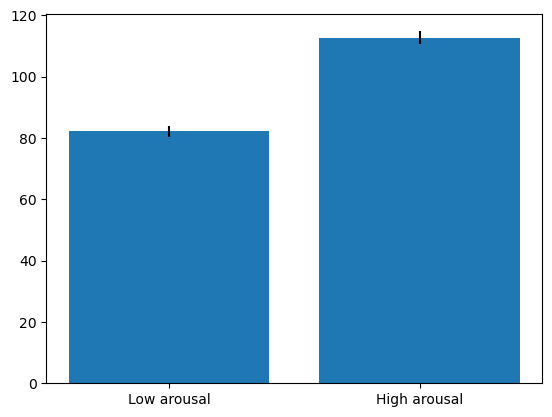

In [ ]:
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut # type: ignore
from scipy.signal import detrend



spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file",filetypes=[("NIdq binary","*.bin")]) # type: ignore
meta  = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data",filetypes=[("Numpy array","*.npy")]) # type: ignore

#stimulusDF['stimstop'] = stimulusDF['stimstart'] + 0.5

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, start_time, cluster_index, ax, stimulusDF):

    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        # Plot raster plot
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial+1)
        ax.set_title(f'Cluster {cluster_index}')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Trial')
        ax.set_xlim(-0.15, 0.15)
    

def calculate_mean_firing_rate(Y, trialDF, i,yesplot=False,pdfname=None):
    spike_counts = []  # List to store firing rates for each trial
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]     
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)

        # Calculate baseline window
        baseline_start = start_time - 0.2  # 200ms before stimulus start
        baseline_end = start_time

        # Update the DataFrame
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
 

    plt.show()

    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
                    
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time+0.035) & (Y <= stop_time)]
        spikes_in_bsl   = Y[(Y >= start_time-0.15+0.035) & (Y <= start_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_count_bsl = len(spikes_in_bsl)
        spkC_evk[index] = spike_count_trial
        spkC_bsl[index] = spike_count_bsl

    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample  = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]

    # Calculate mean firing rate, baseline, and evoked response for each cluster
    #calculate_mean_firing_rate(Y, stimulusDF, i, yesplot, pdfH)
    
    spkC[i],BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i],BSL[i])    
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])    
        #fig, ax = plt.subplots()
        #plot_raster(Y, stimulusDF['stimstart'], i, ax, stimulusDF) 

pupil_diameter = np.load(pupilFullPath)
# ad hoc cleaning needed for 2024-04-11 data
#pupil_diameter[0:80000] = -3900.0
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
yesplot = False
#inds_low = np.where((pupil_trials > 0.25) & (pupil_trials < 0.35))[0]
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:    
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

print(np.mean(spkC_low)/(0.15-0.035))
print(np.mean(spkC_high)/(0.15-0.035))
print(stats.ttest_ind(spkC_low.flatten(),spkC_high.flatten()))
spkC_low = spkC_low/(0.15-0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high/(0.15-0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig,ax = plt.subplots()
ax.bar([1,2],[mnLow,mnHig],yerr=[SELow,SEHig])
ax.set_xticks([1,2])
ax.set_xticklabels(['Low arousal','High arousal'])
plt.show()

Arousal Modulation Index (AMI): 1.3710526315789475
Bootstrap p-value: 0.0


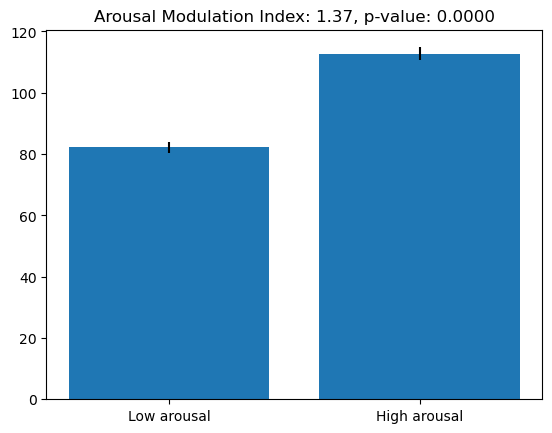

In [ ]:
# Import necessary libraries
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut
from scipy.signal import detrend

# Load data
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file", filetypes=[("NIdq binary", "*.bin")])
meta = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data", filetypes=[("Numpy array", "*.npy")])

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, start_time, cluster_index, ax, stimulusDF):
    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial + 1)
        ax.set_title(f'Cluster {cluster_index}')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Trial')
        ax.set_xlim(-0.15, 0.15)

def calculate_mean_firing_rate(Y, trialDF, i, yesplot=False, pdfname=None):
    spike_counts = []  
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)
        baseline_start = start_time - 0.2
        baseline_end = start_time
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
    if yesplot:
        plt.show()
    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spkC_evk[index] = len(spikes_in_trial)
        spkC_bsl[index] = len(spikes_in_bsl)
    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]
    spkC[i], BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i], BSL[i])
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])

pupil_diameter = np.load(pupilFullPath)
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

# Calculate Arousal Modulation Index (AMI)
ami = np.mean(spkC_high) / np.mean(spkC_low)
print(f"Arousal Modulation Index (AMI): {ami}")

# Perform bootstrapping for significance
def bootstrap_ami(spkC_low, spkC_high, n_bootstrap=10000):
    ami_bootstrap = []
    combined_data = np.concatenate([spkC_low.flatten(), spkC_high.flatten()])
    for _ in range(n_bootstrap):
        low_sample = np.random.choice(combined_data, size=spkC_low.size, replace=True)
        high_sample = np.random.choice(combined_data, size=spkC_high.size, replace=True)
        ami_bootstrap.append(np.mean(high_sample) / np.mean(low_sample))
    return ami_bootstrap

ami_bootstrap = bootstrap_ami(spkC_low, spkC_high)
p_value = np.sum(np.array(ami_bootstrap) >= ami) / len(ami_bootstrap)
print(f"Bootstrap p-value: {p_value}")

# Plot AMI with error bars
spkC_low = spkC_low / (0.15 - 0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high / (0.15 - 0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig, ax = plt.subplots()
ax.bar([1, 2], [mnLow, mnHig], yerr=[SELow, SEHig])
ax.set_xticks([1, 2])
ax.set_xticklabels(['Low arousal', 'High arousal'])
ax.set_title(f'Arousal Modulation Index: {ami:.2f}, p-value: {p_value:.4f}')
plt.show()

Arousal Modulation Index (AMI): 1.3710526315789475
Bootstrap p-value: 0.0


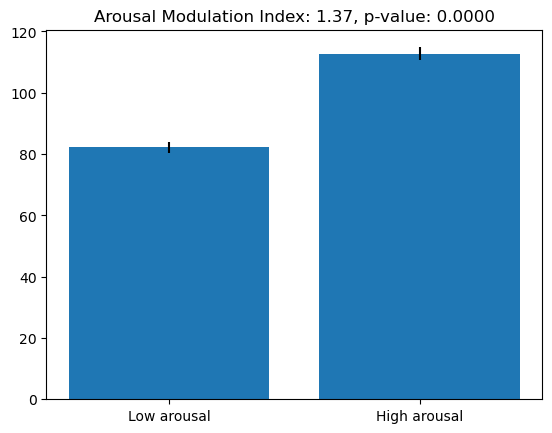

In [ ]:
# Import necessary libraries
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut
from scipy.signal import detrend

# Load data
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file", filetypes=[("NIdq binary", "*.bin")])
meta = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data", filetypes=[("Numpy array", "*.npy")])

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, start_time, cluster_index, ax, stimulusDF):
    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial + 1)
        ax.set_title(f'Cluster {cluster_index}')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Trial')
        ax.set_xlim(-0.15, 0.15)

def calculate_mean_firing_rate(Y, trialDF, i, yesplot=False, pdfname=None):
    spike_counts = []  
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)
        baseline_start = start_time - 0.2
        baseline_end = start_time
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
    if yesplot:
        plt.show()
    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spkC_evk[index] = len(spikes_in_trial)
        spkC_bsl[index] = len(spikes_in_bsl)
    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]
    spkC[i], BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i], BSL[i])
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])

pupil_diameter = np.load(pupilFullPath)
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

# Calculate Arousal Modulation Index (AMI)
ami = np.mean(spkC_high) / np.mean(spkC_low)
print(f"Arousal Modulation Index (AMI): {ami}")

# Perform bootstrapping for significance
def bootstrap_ami(spkC_low, spkC_high, n_bootstrap=10000):
    ami_bootstrap = []
    combined_data = np.concatenate([spkC_low.flatten(), spkC_high.flatten()])
    for _ in range(n_bootstrap):
        low_sample = np.random.choice(combined_data, size=spkC_low.size, replace=True)
        high_sample = np.random.choice(combined_data, size=spkC_high.size, replace=True)
        ami_bootstrap.append(np.mean(high_sample) / np.mean(low_sample))
    return ami_bootstrap

ami_bootstrap = bootstrap_ami(spkC_low, spkC_high)
p_value = np.sum(np.array(ami_bootstrap) >= ami) / len(ami_bootstrap)
print(f"Bootstrap p-value: {p_value}")

# Plot AMI with error bars
spkC_low = spkC_low / (0.15 - 0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high / (0.15 - 0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig, ax = plt.subplots()
ax.bar([1, 2], [mnLow, mnHig], yerr=[SELow, SEHig])
ax.set_xticks([1, 2])
ax.set_xticklabels(['Low arousal', 'High arousal'])
ax.set_title(f'Arousal Modulation Index: {ami:.2f}, p-value: {p_value:.4f}')
plt.show()

Arousal Modulation Index (AMI): 1.2102836207441097
Bootstrap p-value: 0.0


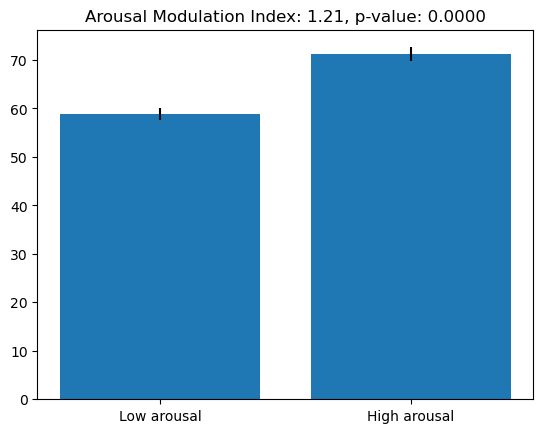

In [ ]:
# Import necessary libraries
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut
from scipy.signal import detrend

# Load data
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file", filetypes=[("NIdq binary", "*.bin")])
meta = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data", filetypes=[("Numpy array", "*.npy")])

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, start_time, cluster_index, ax, stimulusDF):
    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial + 1)
        ax.set_title(f'Cluster {cluster_index}')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Trial')
        ax.set_xlim(-0.15, 0.15)

def calculate_mean_firing_rate(Y, trialDF, i, yesplot=False, pdfname=None):
    spike_counts = []  
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)
        baseline_start = start_time - 0.2
        baseline_end = start_time
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
    if yesplot:
        plt.show()
    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spkC_evk[index] = len(spikes_in_trial)
        spkC_bsl[index] = len(spikes_in_bsl)
    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]
    spkC[i], BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i], BSL[i])
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])

pupil_diameter = np.load(pupilFullPath)
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

# Calculate Arousal Modulation Index (AMI)
ami = np.mean(spkC_high) / np.mean(spkC_low)
print(f"Arousal Modulation Index (AMI): {ami}")

# Perform bootstrapping for significance
def bootstrap_ami(spkC_low, spkC_high, n_bootstrap=10000):
    ami_bootstrap = []
    combined_data = np.concatenate([spkC_low.flatten(), spkC_high.flatten()])
    for _ in range(n_bootstrap):
        low_sample = np.random.choice(combined_data, size=spkC_low.size, replace=True)
        high_sample = np.random.choice(combined_data, size=spkC_high.size, replace=True)
        ami_bootstrap.append(np.mean(high_sample) / np.mean(low_sample))
    return ami_bootstrap

ami_bootstrap = bootstrap_ami(spkC_low, spkC_high)
p_value = np.sum(np.array(ami_bootstrap) >= ami) / len(ami_bootstrap)
print(f"Bootstrap p-value: {p_value}")

# Plot AMI with error bars
spkC_low = spkC_low / (0.15 - 0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high / (0.15 - 0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig, ax = plt.subplots()
ax.bar([1, 2], [mnLow, mnHig], yerr=[SELow, SEHig])
ax.set_xticks([1, 2])
ax.set_xticklabels(['Low arousal', 'High arousal'])
ax.set_title(f'Arousal Modulation Index: {ami:.2f}, p-value: {p_value:.4f}')
plt.show()

Arousal Modulation Index (AMI): 1.2102836207441097
Bootstrap p-value: 0.0


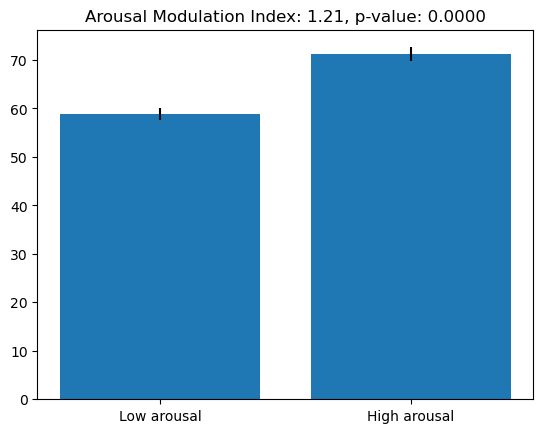

In [ ]:
# Import necessary libraries
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut
from scipy.signal import detrend

# Load data
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file", filetypes=[("NIdq binary", "*.bin")])
meta = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data", filetypes=[("Numpy array", "*.npy")])

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, start_time, cluster_index, ax, stimulusDF):
    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial + 1)
        ax.set_title(f'Cluster {cluster_index}')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Trial')
        ax.set_xlim(-0.15, 0.15)

def calculate_mean_firing_rate(Y, trialDF, i, yesplot=False, pdfname=None):
    spike_counts = []  
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)
        baseline_start = start_time - 0.2
        baseline_end = start_time
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
    if yesplot:
        plt.show()
    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spkC_evk[index] = len(spikes_in_trial)
        spkC_bsl[index] = len(spikes_in_bsl)
    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]
    spkC[i], BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i], BSL[i])
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])

pupil_diameter = np.load(pupilFullPath)
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

# Calculate Arousal Modulation Index (AMI)
ami = np.mean(spkC_high) / np.mean(spkC_low)
print(f"Arousal Modulation Index (AMI): {ami}")

# Perform bootstrapping for significance
def bootstrap_ami(spkC_low, spkC_high, n_bootstrap=10000):
    ami_bootstrap = []
    combined_data = np.concatenate([spkC_low.flatten(), spkC_high.flatten()])
    for _ in range(n_bootstrap):
        low_sample = np.random.choice(combined_data, size=spkC_low.size, replace=True)
        high_sample = np.random.choice(combined_data, size=spkC_high.size, replace=True)
        ami_bootstrap.append(np.mean(high_sample) / np.mean(low_sample))
    return ami_bootstrap

ami_bootstrap = bootstrap_ami(spkC_low, spkC_high)
p_value = np.sum(np.array(ami_bootstrap) >= ami) / len(ami_bootstrap)
print(f"Bootstrap p-value: {p_value}")

# Plot AMI with error bars
spkC_low = spkC_low / (0.15 - 0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high / (0.15 - 0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig, ax = plt.subplots()
ax.bar([1, 2], [mnLow, mnHig], yerr=[SELow, SEHig])
ax.set_xticks([1, 2])
ax.set_xticklabels(['Low arousal', 'High arousal'])
ax.set_title(f'Arousal Modulation Index: {ami:.2f}, p-value: {p_value:.4f}')
plt.show()

Arousal Modulation Index (AMI): 1.2102836207441097
Bootstrap p-value: 0.0


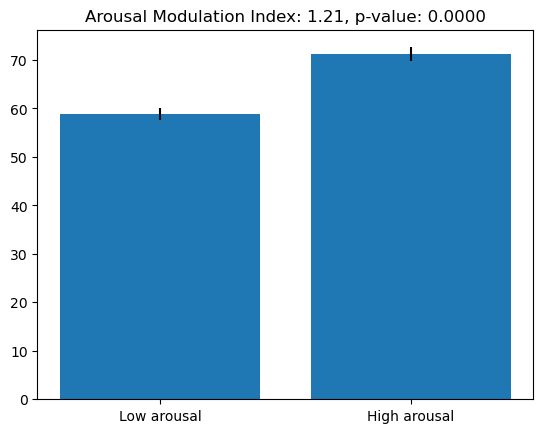

In [ ]:
# Import necessary libraries
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut
from scipy.signal import detrend

# Load data
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file", filetypes=[("NIdq binary", "*.bin")])
meta = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data", filetypes=[("Numpy array", "*.npy")])

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, start_time, cluster_index, ax, stimulusDF):
    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial + 1)
        ax.set_title(f'Cluster {cluster_index}')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Trial')
        ax.set_xlim(-0.15, 0.15)

def calculate_mean_firing_rate(Y, trialDF, i, yesplot=False, pdfname=None):
    spike_counts = []  
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)
        baseline_start = start_time - 0.2
        baseline_end = start_time
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
    if yesplot:
        plt.show()
    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spkC_evk[index] = len(spikes_in_trial)
        spkC_bsl[index] = len(spikes_in_bsl)
    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]
    spkC[i], BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i], BSL[i])
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])

pupil_diameter = np.load(pupilFullPath)
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

# Calculate Arousal Modulation Index (AMI)
ami = np.mean(spkC_high) / np.mean(spkC_low)
print(f"Arousal Modulation Index (AMI): {ami}")

# Perform bootstrapping for significance
def bootstrap_ami(spkC_low, spkC_high, n_bootstrap=10000):
    ami_bootstrap = []
    combined_data = np.concatenate([spkC_low.flatten(), spkC_high.flatten()])
    for _ in range(n_bootstrap):
        low_sample = np.random.choice(combined_data, size=spkC_low.size, replace=True)
        high_sample = np.random.choice(combined_data, size=spkC_high.size, replace=True)
        ami_bootstrap.append(np.mean(high_sample) / np.mean(low_sample))
    return ami_bootstrap

ami_bootstrap = bootstrap_ami(spkC_low, spkC_high)
p_value = np.sum(np.array(ami_bootstrap) >= ami) / len(ami_bootstrap)
print(f"Bootstrap p-value: {p_value}")

# Plot AMI with error bars
spkC_low = spkC_low / (0.15 - 0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high / (0.15 - 0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig, ax = plt.subplots()
ax.bar([1, 2], [mnLow, mnHig], yerr=[SELow, SEHig])
ax.set_xticks([1, 2])
ax.set_xticklabels(['Low arousal', 'High arousal'])
ax.set_title(f'Arousal Modulation Index: {ami:.2f}, p-value: {p_value:.4f}')
plt.show()

Arousal Modulation Index (AMI): 1.2102836207441097
Bootstrap p-value: 0.0


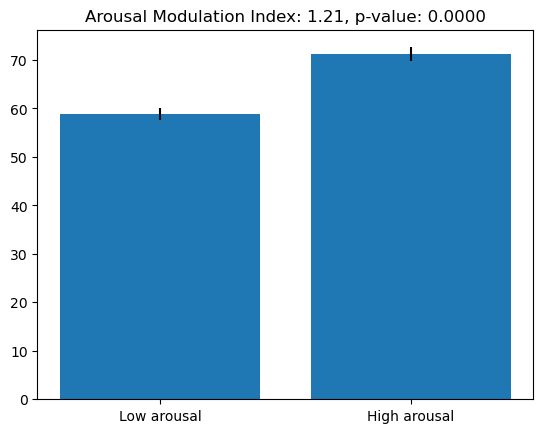

In [ ]:
# Import necessary libraries
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut
from scipy.signal import detrend

# Load data
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file", filetypes=[("NIdq binary", "*.bin")])
meta = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data", filetypes=[("Numpy array", "*.npy")])

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, start_time, cluster_index, ax, stimulusDF):
    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial + 1)
        ax.set_title(f'Cluster {cluster_index}')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Trial')
        ax.set_xlim(-0.15, 0.15)

def calculate_mean_firing_rate(Y, trialDF, i, yesplot=False, pdfname=None):
    spike_counts = []  
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)
        baseline_start = start_time - 0.2
        baseline_end = start_time
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
    if yesplot:
        plt.show()
    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spkC_evk[index] = len(spikes_in_trial)
        spkC_bsl[index] = len(spikes_in_bsl)
    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]
    spkC[i], BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i], BSL[i])
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])

pupil_diameter = np.load(pupilFullPath)
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

# Calculate Arousal Modulation Index (AMI)
ami = np.mean(spkC_high) / np.mean(spkC_low)
print(f"Arousal Modulation Index (AMI): {ami}")

# Perform bootstrapping for significance
def bootstrap_ami(spkC_low, spkC_high, n_bootstrap=10000):
    ami_bootstrap = []
    combined_data = np.concatenate([spkC_low.flatten(), spkC_high.flatten()])
    for _ in range(n_bootstrap):
        low_sample = np.random.choice(combined_data, size=spkC_low.size, replace=True)
        high_sample = np.random.choice(combined_data, size=spkC_high.size, replace=True)
        ami_bootstrap.append(np.mean(high_sample) / np.mean(low_sample))
    return ami_bootstrap

ami_bootstrap = bootstrap_ami(spkC_low, spkC_high)
p_value = np.sum(np.array(ami_bootstrap) >= ami) / len(ami_bootstrap)
print(f"Bootstrap p-value: {p_value}")

# Plot AMI with error bars
spkC_low = spkC_low / (0.15 - 0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high / (0.15 - 0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig, ax = plt.subplots()
ax.bar([1, 2], [mnLow, mnHig], yerr=[SELow, SEHig])
ax.set_xticks([1, 2])
ax.set_xticklabels(['Low arousal', 'High arousal'])
ax.set_title(f'Arousal Modulation Index: {ami:.2f}, p-value: {p_value:.4f}')
plt.show()

Arousal Modulation Index (AMI): 1.2102836207441097
Bootstrap p-value: 0.0


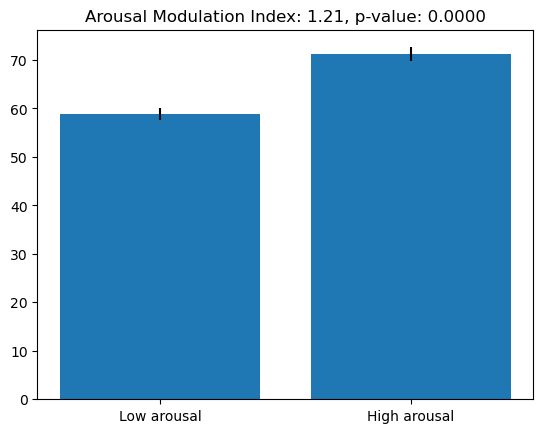

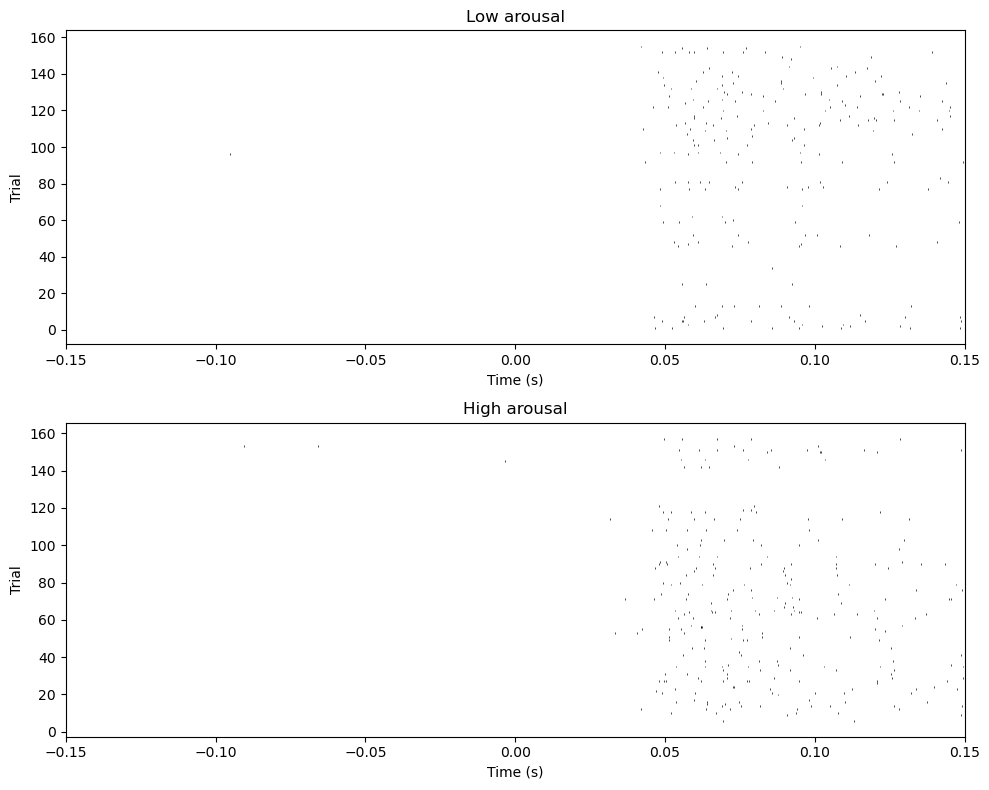

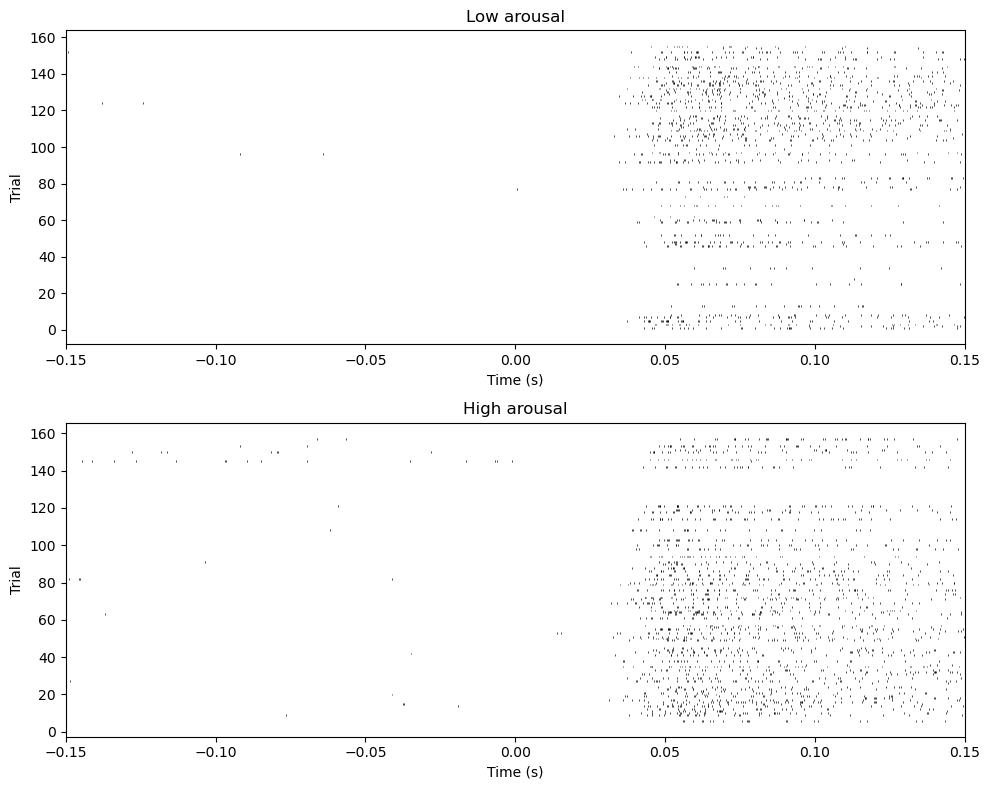

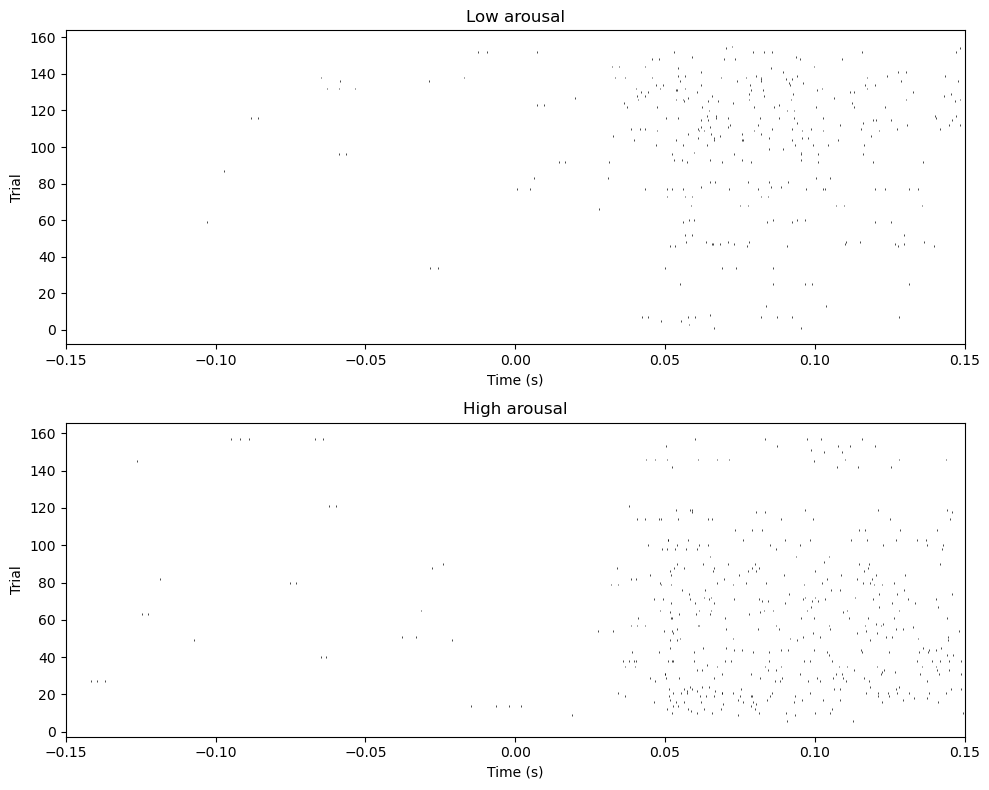

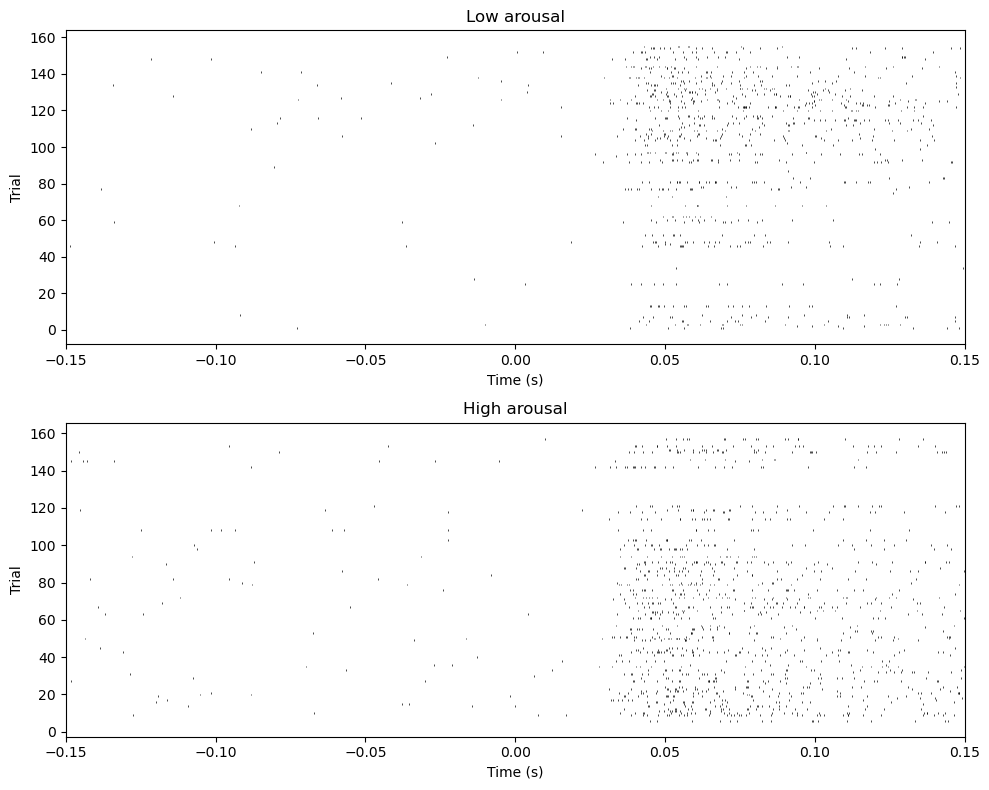

...

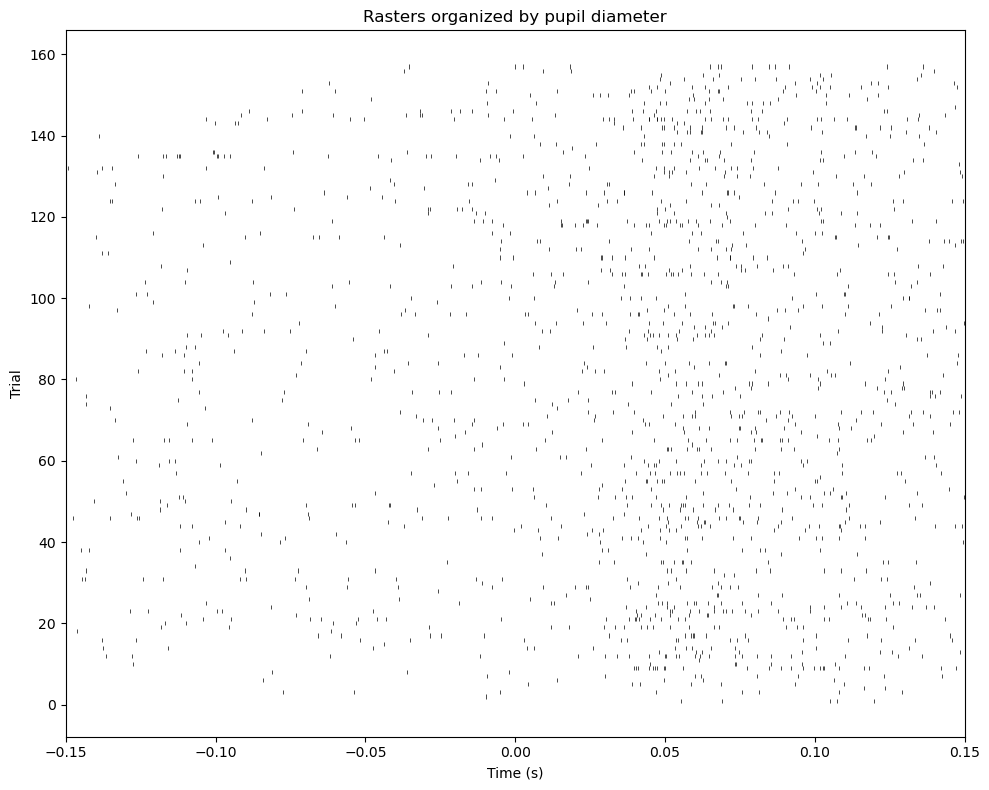

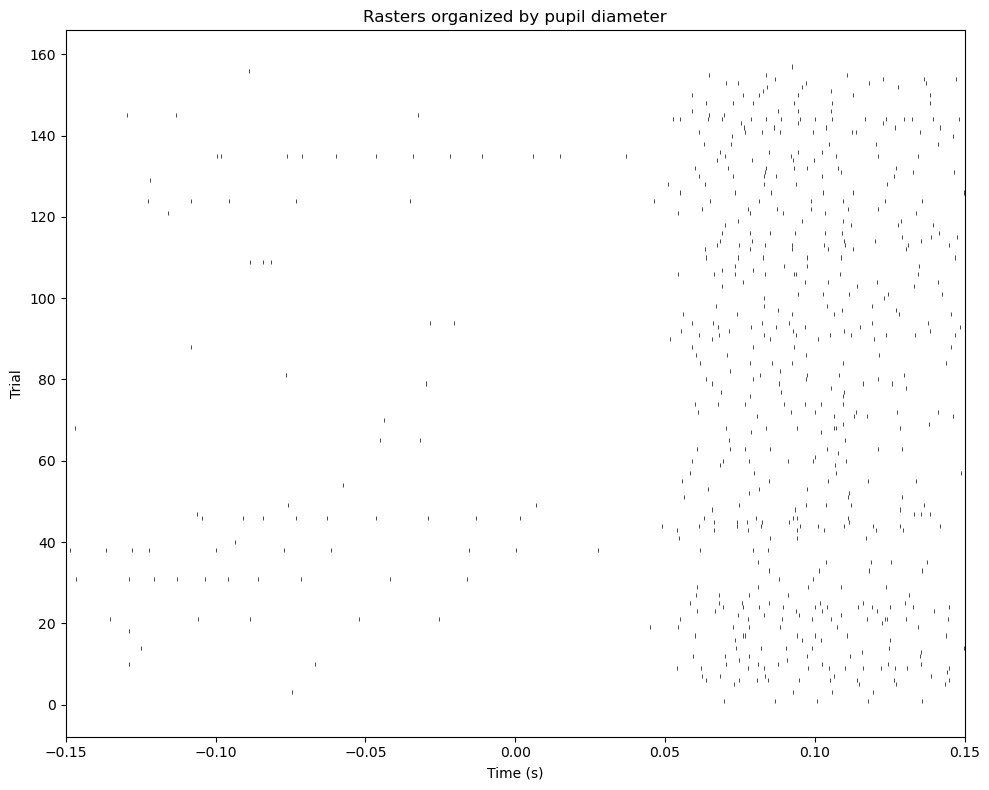

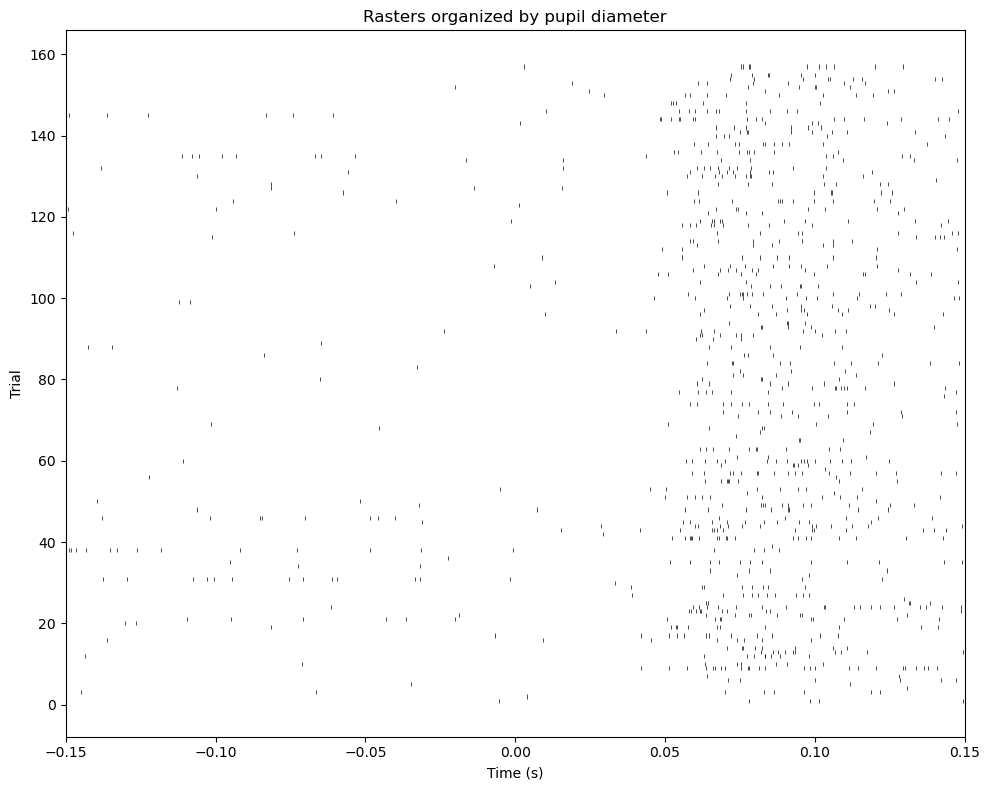

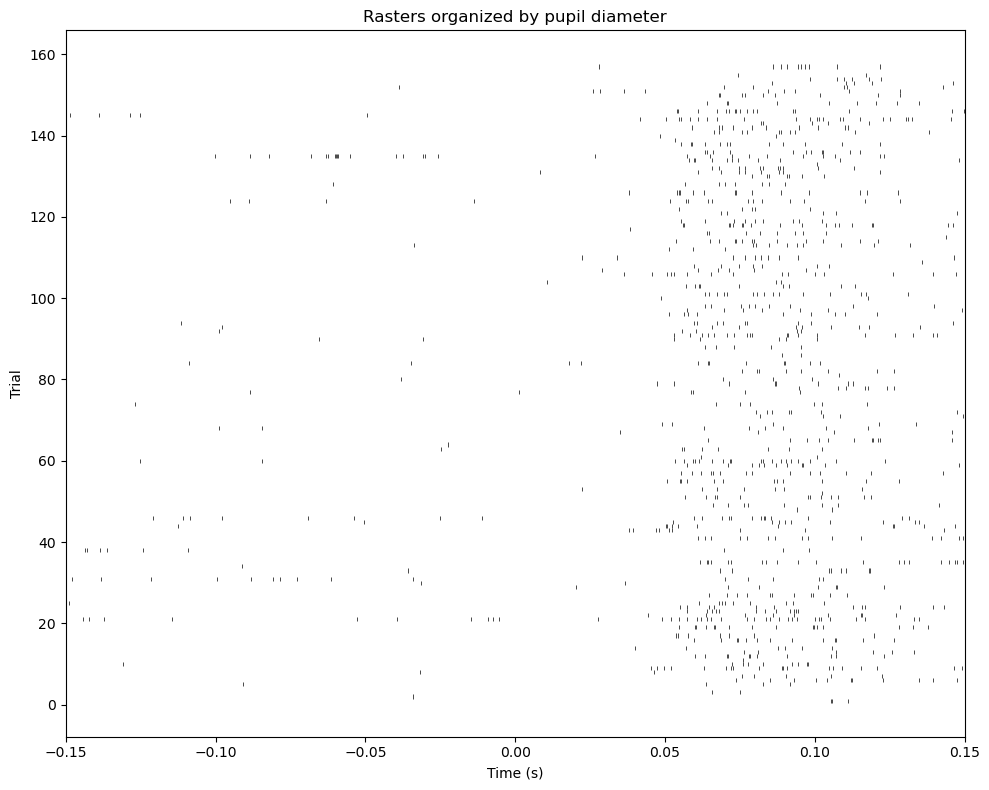

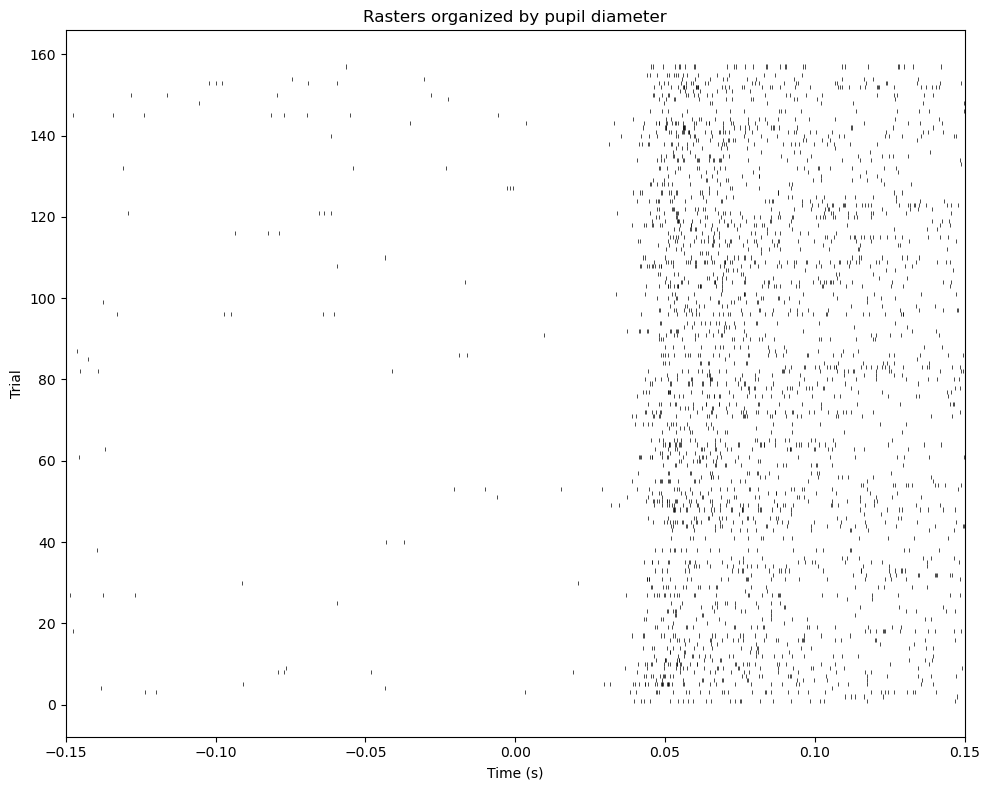

In [ ]:
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut
from scipy.signal import detrend

# Load data
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file", filetypes=[("NIdq binary", "*.bin")])
meta = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data", filetypes=[("Numpy array", "*.npy")])

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, cluster_index, ax, stimulusDF, title):
    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial + 1)
    ax.set_title(title)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Trial')
    ax.set_xlim(-0.15, 0.15)

def calculate_mean_firing_rate(Y, trialDF, i, yesplot=False, pdfname=None):
    spike_counts = []  
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)
        baseline_start = start_time - 0.2
        baseline_end = start_time
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
    if yesplot:
        plt.show()
    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spkC_evk[index] = len(spikes_in_trial)
        spkC_bsl[index] = len(spikes_in_bsl)
    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]
    spkC[i], BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i], BSL[i])
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])

pupil_diameter = np.load(pupilFullPath)
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

# Calculate Arousal Modulation Index (AMI)
ami = np.mean(spkC_high) / np.mean(spkC_low)
print(f"Arousal Modulation Index (AMI): {ami}")

# Perform bootstrapping for significance
def bootstrap_ami(spkC_low, spkC_high, n_bootstrap=10000):
    ami_bootstrap = []
    combined_data = np.concatenate([spkC_low.flatten(), spkC_high.flatten()])
    for _ in range(n_bootstrap):
        low_sample = np.random.choice(combined_data, size=spkC_low.size, replace=True)
        high_sample = np.random.choice(combined_data, size=spkC_high.size, replace=True)
        ami_bootstrap.append(np.mean(high_sample) / np.mean(low_sample))
    return ami_bootstrap

ami_bootstrap = bootstrap_ami(spkC_low, spkC_high)
p_value = np.sum(np.array(ami_bootstrap) >= ami) / len(ami_bootstrap)
print(f"Bootstrap p-value: {p_value}")

# Plot AMI with error bars
spkC_low = spkC_low / (0.15 - 0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high / (0.15 - 0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig, ax = plt.subplots()
ax.bar([1, 2], [mnLow, mnHig], yerr=[SELow, SEHig])
ax.set_xticks([1, 2])
ax.set_xticklabels(['Low arousal', 'High arousal'])
ax.set_title(f'Arousal Modulation Index: {ami:.2f}, p-value: {p_value:.4f}')
plt.show()

# Plot rasters for low and high arousal states
for c in good_clusters:
    Y = spike_times_clusters[c]
    fig, axs = plt.subplots(2, 1, figsize=(10, 8))
    plot_raster(Y, c, axs[0], stimulusDF.iloc[inds_low], title='Low arousal')
    plot_raster(Y, c, axs[1], stimulusDF.iloc[inds_high], title='High arousal')
    plt.tight_layout()
    plt.show()

# Plot rasters organized by pupil diameter
for c in good_clusters:
    Y = spike_times_clusters[c]
    sorted_indices = np.argsort(pupil_trials)
    sorted_stimulusDF = stimulusDF.iloc[sorted_indices]
    fig, ax = plt.subplots(figsize=(10, 8))
    plot_raster(Y, c, ax, sorted_stimulusDF, title='Rasters organized by pupil diameter')
    plt.tight_layout()
    plt.show()

Arousal Modulation Index (AMI): 1.3710526315789475
Bootstrap p-value: 0.0


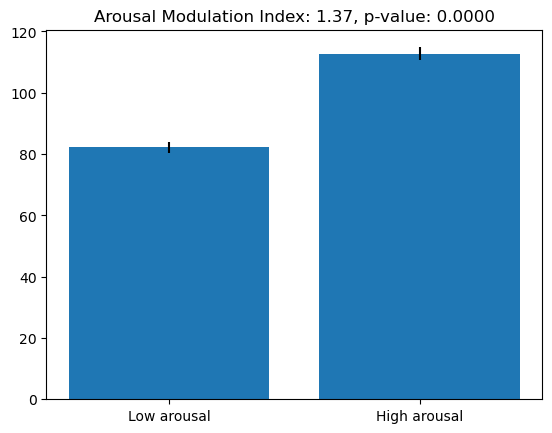

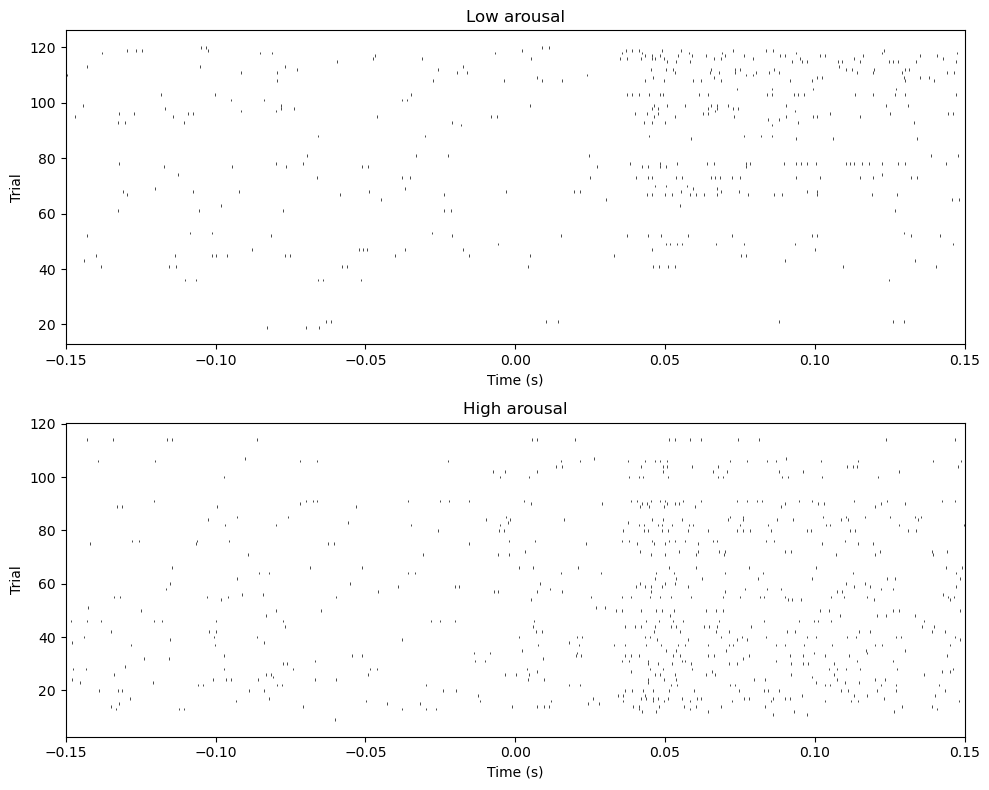

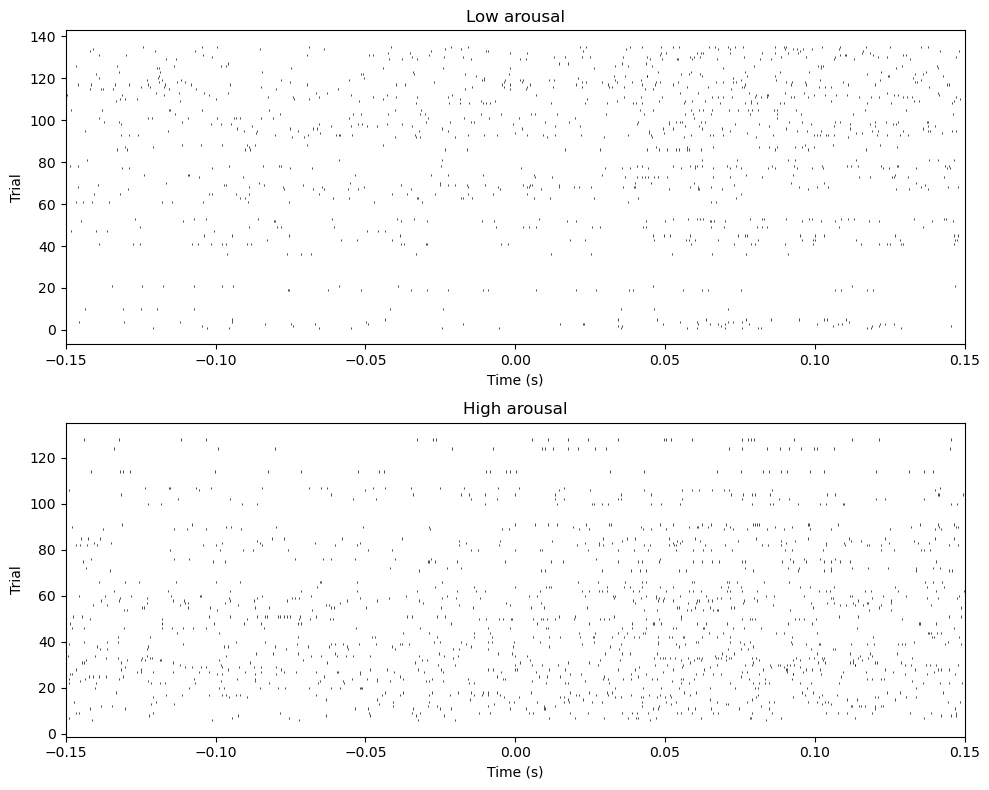

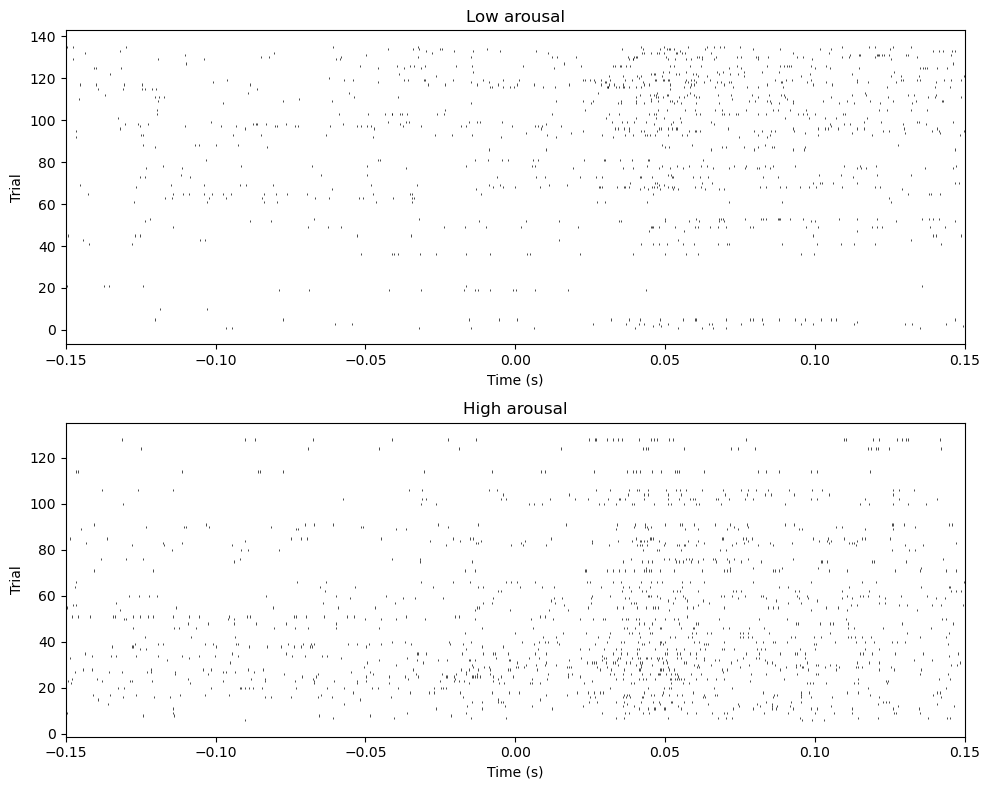

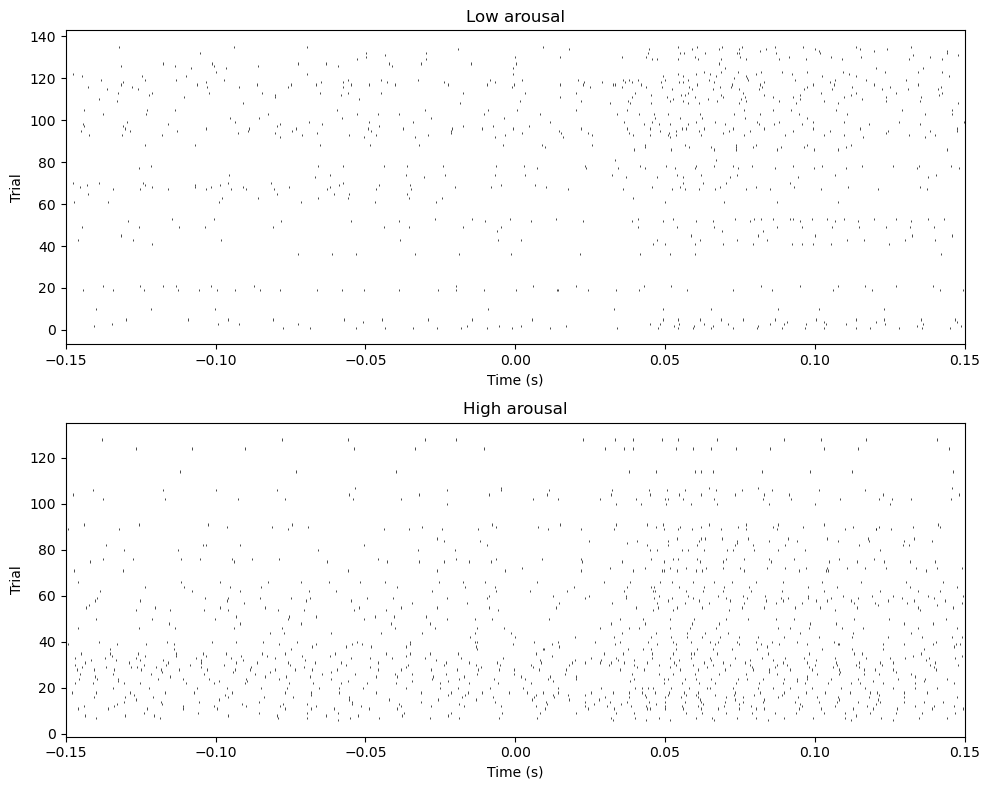

...

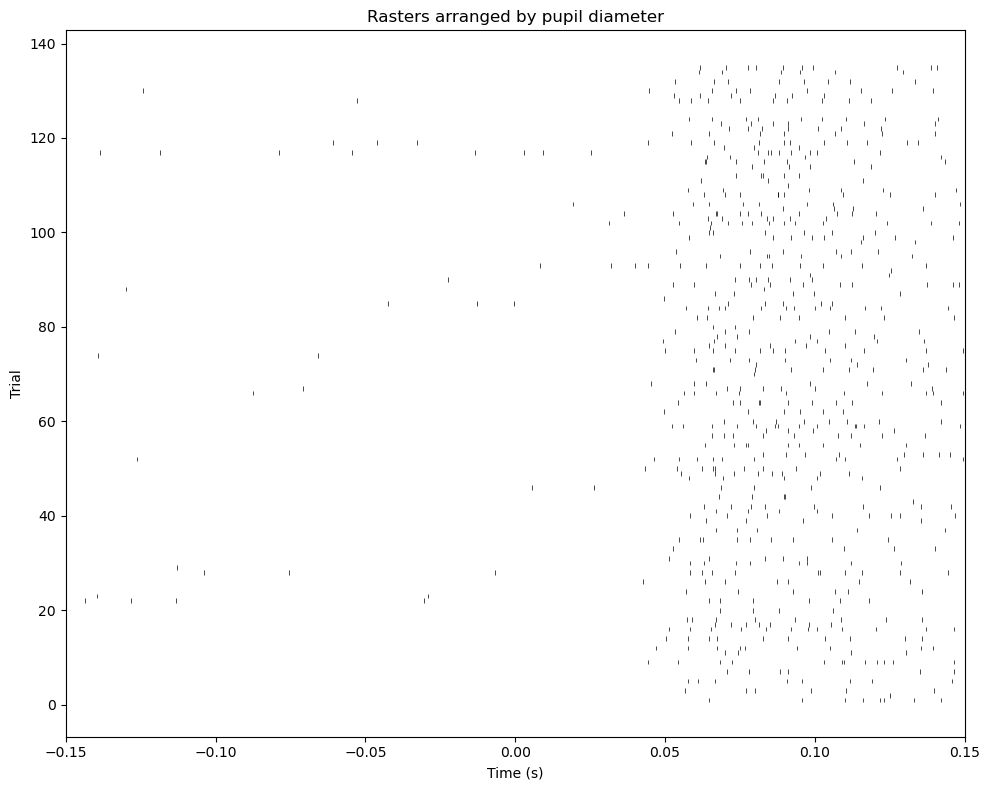

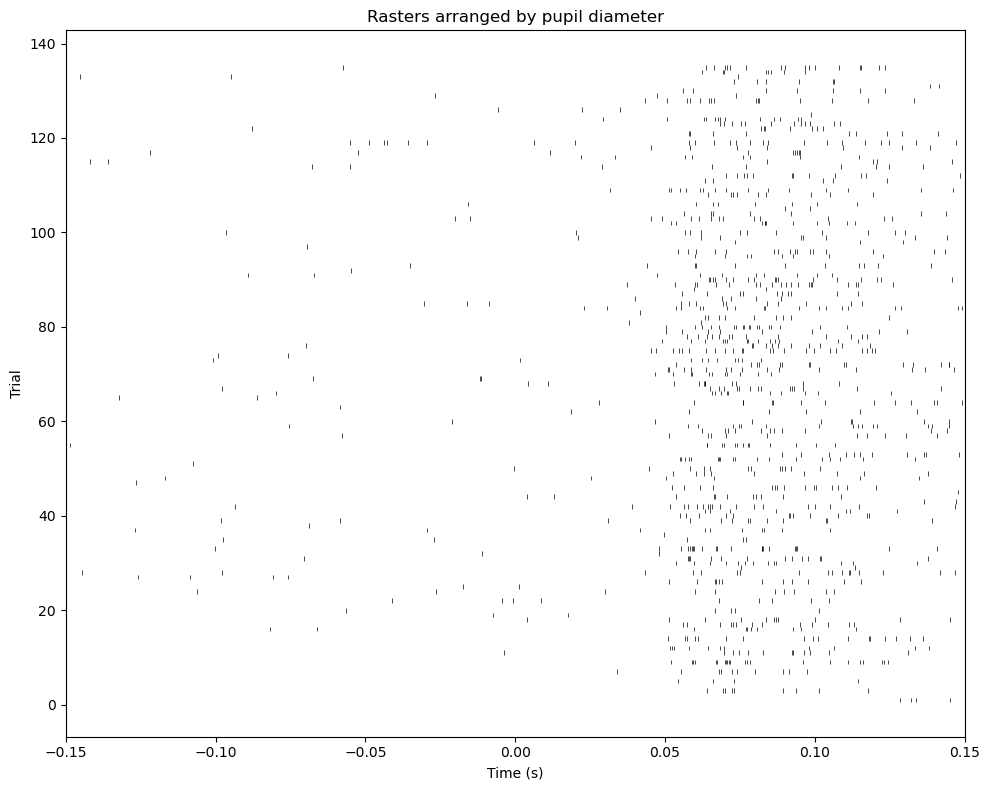

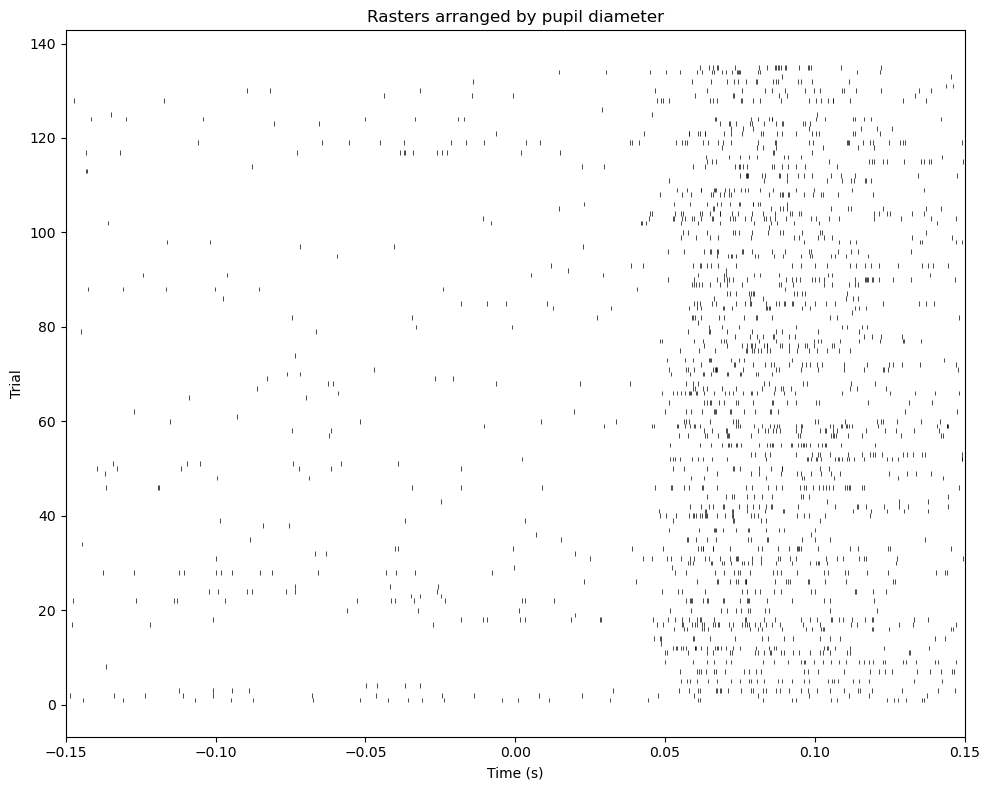

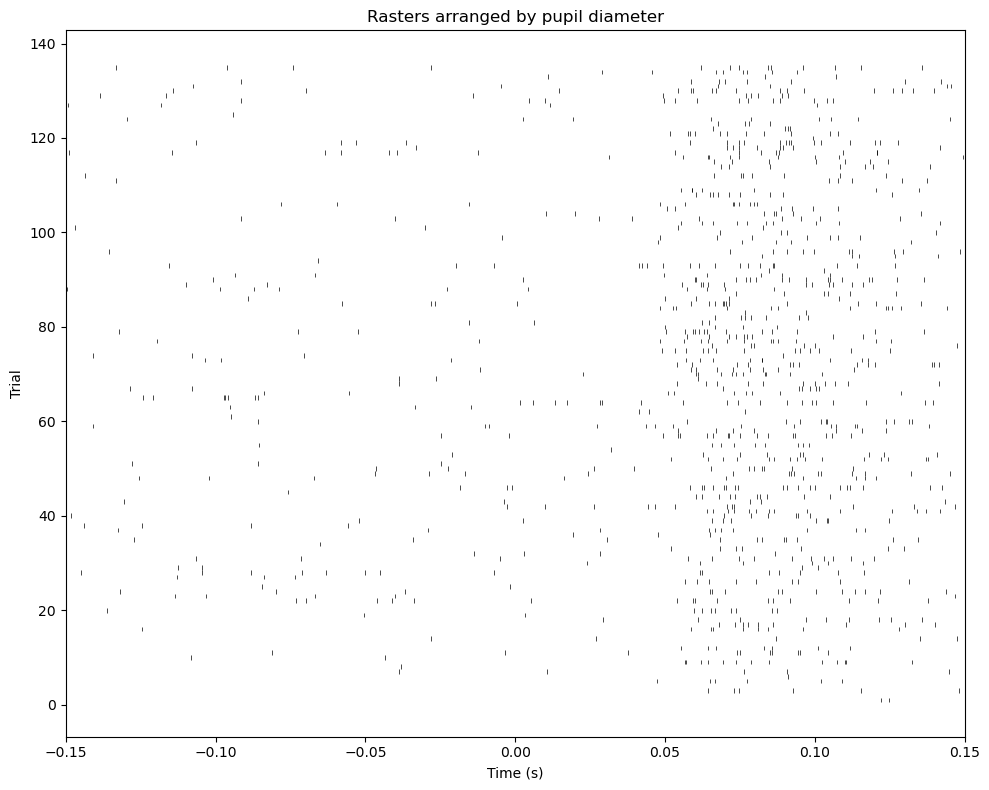

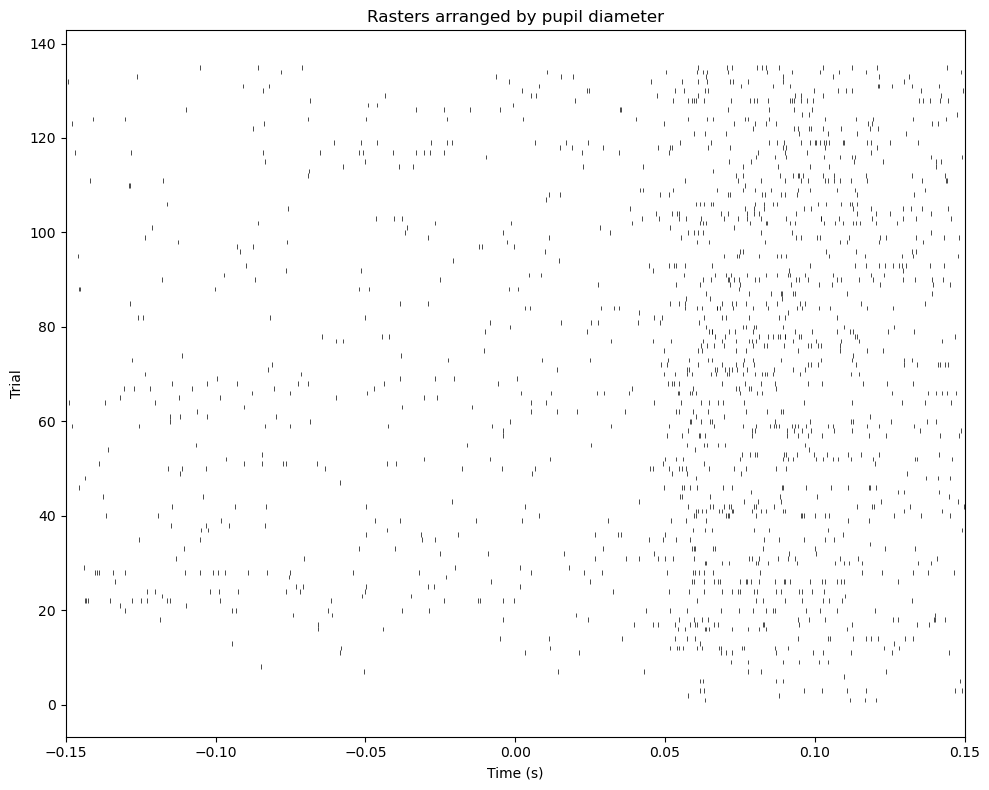

In [ ]:
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut
from scipy.signal import detrend

# Load data
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file", filetypes=[("NIdq binary", "*.bin")])
meta = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data", filetypes=[("Numpy array", "*.npy")])

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, cluster_index, ax, stimulusDF, title):
    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial + 1)
    ax.set_title(title)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Trial')
    ax.set_xlim(-0.15, 0.15)

def calculate_mean_firing_rate(Y, trialDF, i, yesplot=False, pdfname=None):
    spike_counts = []  
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)
        baseline_start = start_time - 0.2
        baseline_end = start_time
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
    if yesplot:
        plt.show()
    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spkC_evk[index] = len(spikes_in_trial)
        spkC_bsl[index] = len(spikes_in_bsl)
    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]
    spkC[i], BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i], BSL[i])
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])

pupil_diameter = np.load(pupilFullPath)
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

#  (AMI)
ami = np.mean(spkC_high) / np.mean(spkC_low)
print(f"Arousal Modulation Index (AMI): {ami}")

# bootstrapping 
def bootstrap_ami(spkC_low, spkC_high, n_bootstrap=10000):
    ami_bootstrap = []
    combined_data = np.concatenate([spkC_low.flatten(), spkC_high.flatten()])
    for _ in range(n_bootstrap):
        low_sample = np.random.choice(combined_data, size=spkC_low.size, replace=True)
        high_sample = np.random.choice(combined_data, size=spkC_high.size, replace=True)
        ami_bootstrap.append(np.mean(high_sample) / np.mean(low_sample))
    return ami_bootstrap

ami_bootstrap = bootstrap_ami(spkC_low, spkC_high)
p_value = np.sum(np.array(ami_bootstrap) >= ami) / len(ami_bootstrap)
print(f"Bootstrap p-value: {p_value}")

# Plot AMI 
spkC_low = spkC_low / (0.15 - 0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high / (0.15 - 0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig, ax = plt.subplots()
ax.bar([1, 2], [mnLow, mnHig], yerr=[SELow, SEHig])
ax.set_xticks([1, 2])
ax.set_xticklabels(['Low arousal', 'High arousal'])
ax.set_title(f'Arousal Modulation Index: {ami:.2f}, p-value: {p_value:.4f}')
plt.show()

# rasters for low and high arousal states
for c in good_clusters:
    Y = spike_times_clusters[c]
    fig, axs = plt.subplots(2, 1, figsize=(10, 8))
    plot_raster(Y, c, axs[0], stimulusDF.iloc[inds_low], title='Low arousal')
    plot_raster(Y, c, axs[1], stimulusDF.iloc[inds_high], title='High arousal')
    plt.tight_layout()
    plt.show()

#  rasters by pupil diameter
for c in good_clusters:
    Y = spike_times_clusters[c]
    sorted_indices = np.argsort(pupil_trials)
    sorted_stimulusDF = stimulusDF.iloc[sorted_indices]
    fig, ax = plt.subplots(figsize=(10, 8))
    plot_raster(Y, c, ax, sorted_stimulusDF, title='Rasters arranged by pupil diameter')
    plt.tight_layout()
    plt.show()

Arousal Modulation Index (AMI): 1.2102836207441097
Bootstrap p-value: 0.0


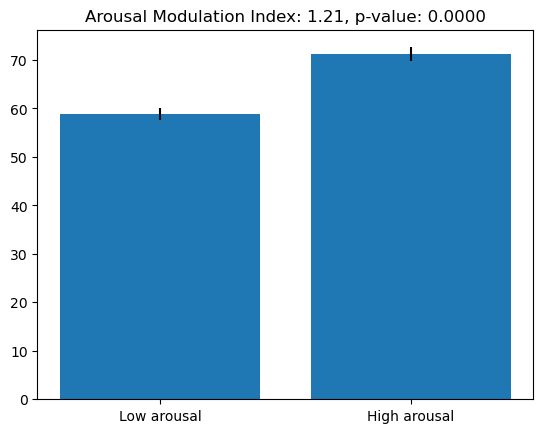

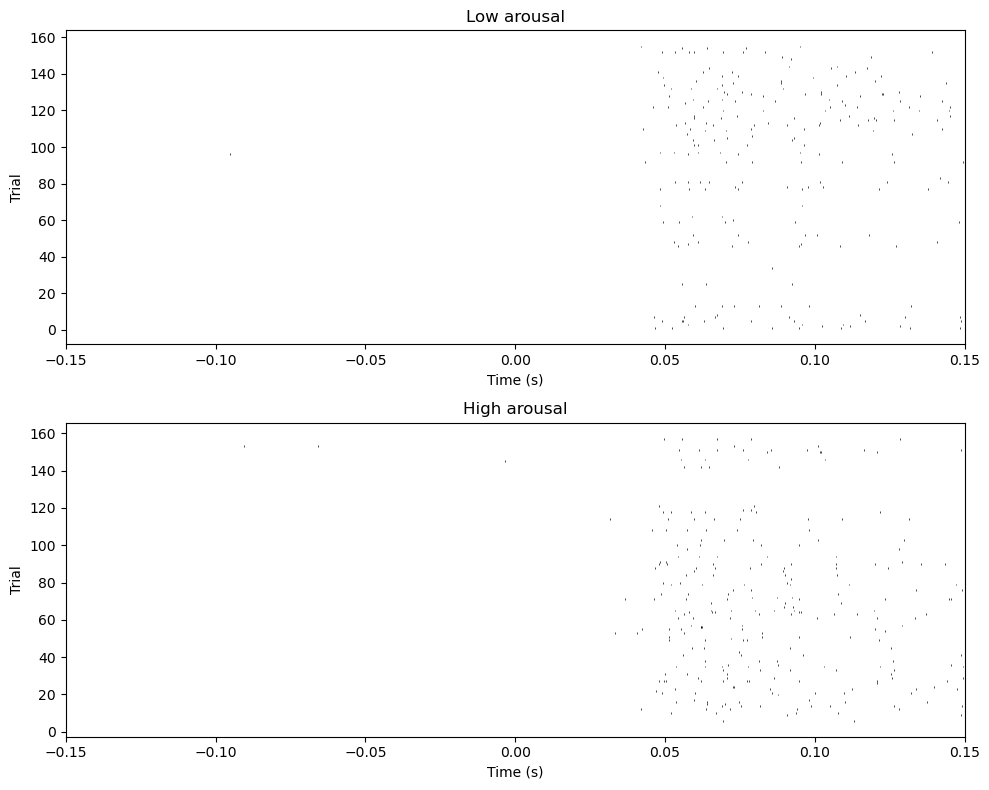

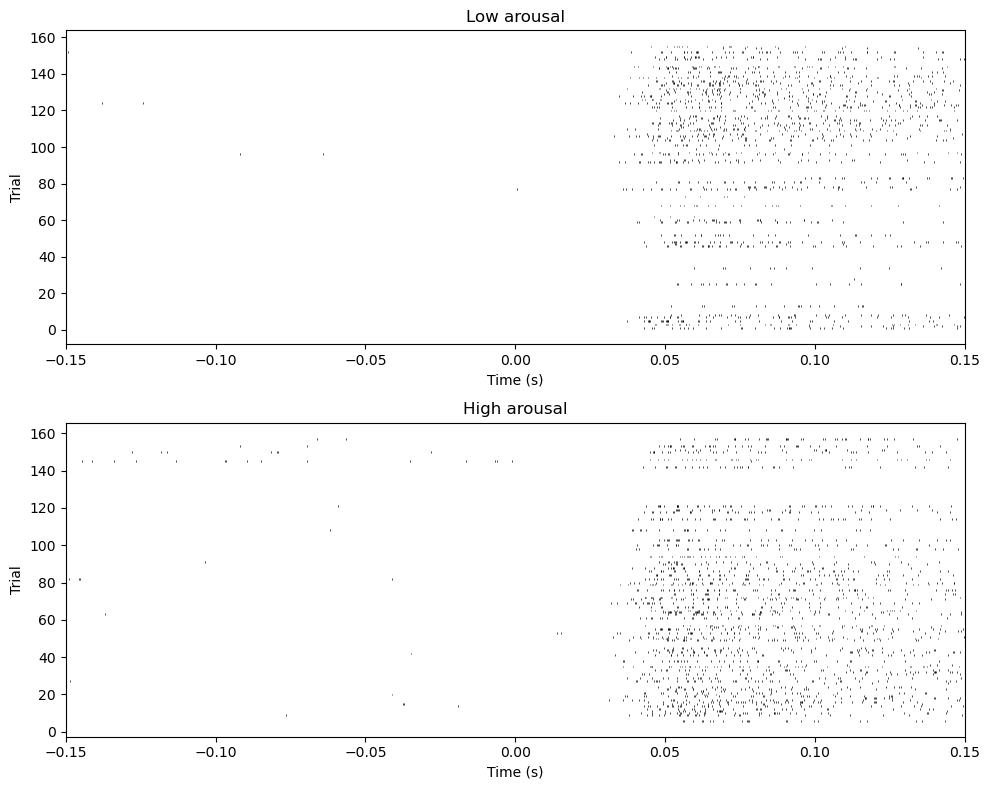

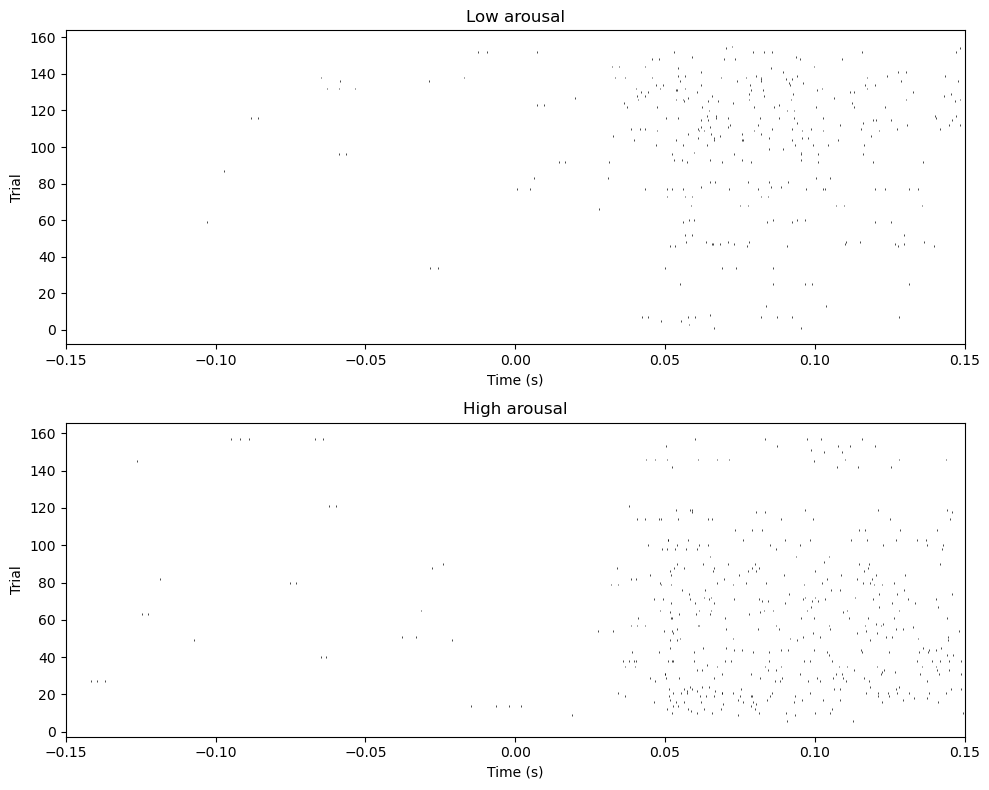

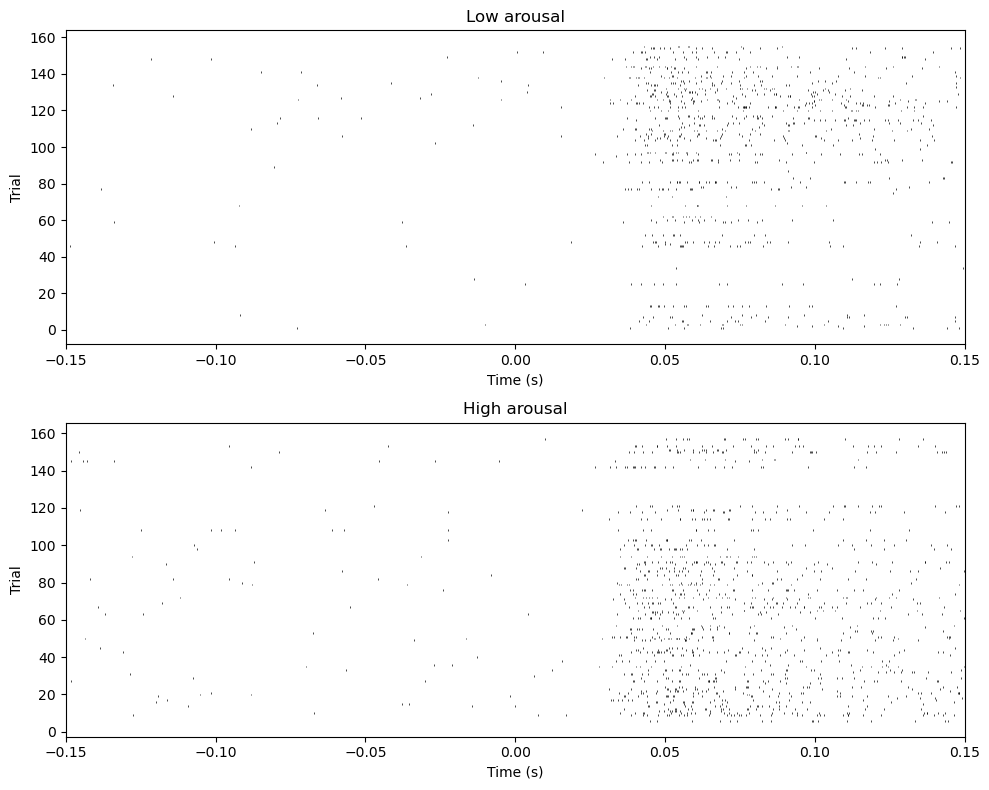

...

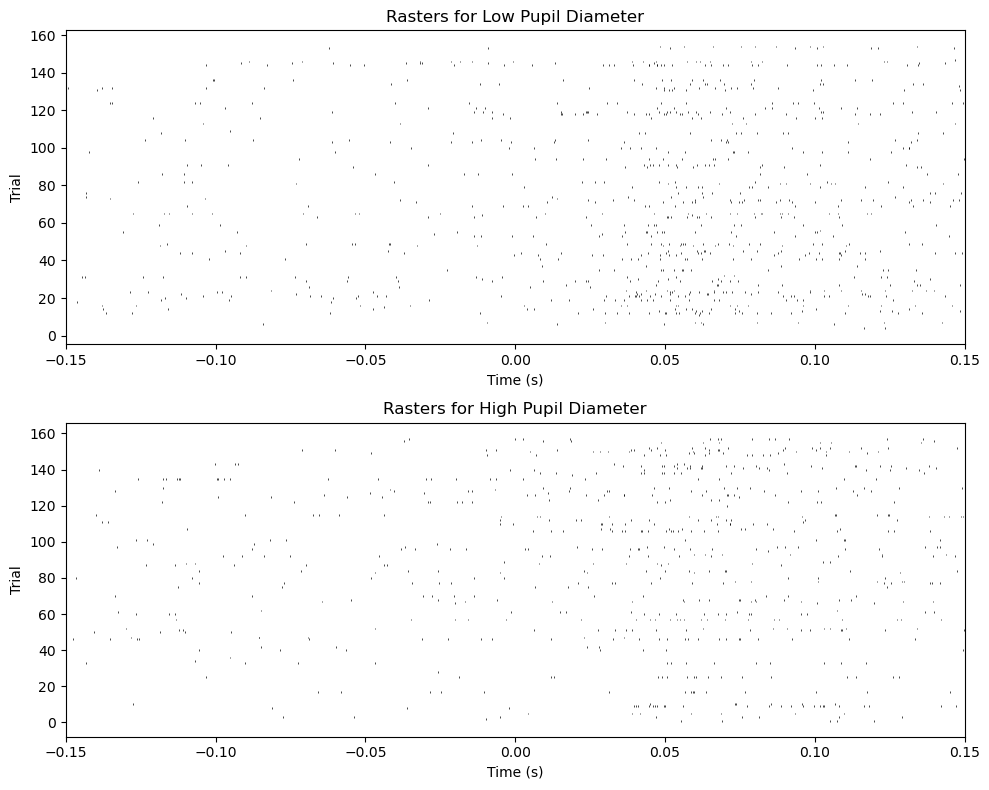

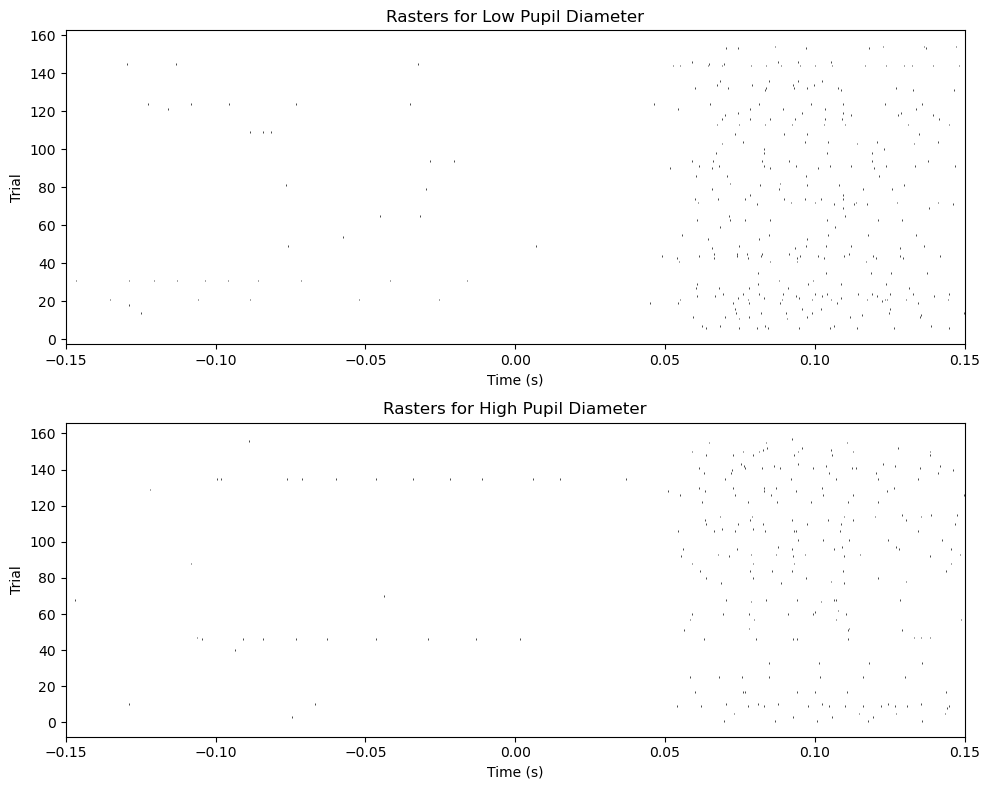

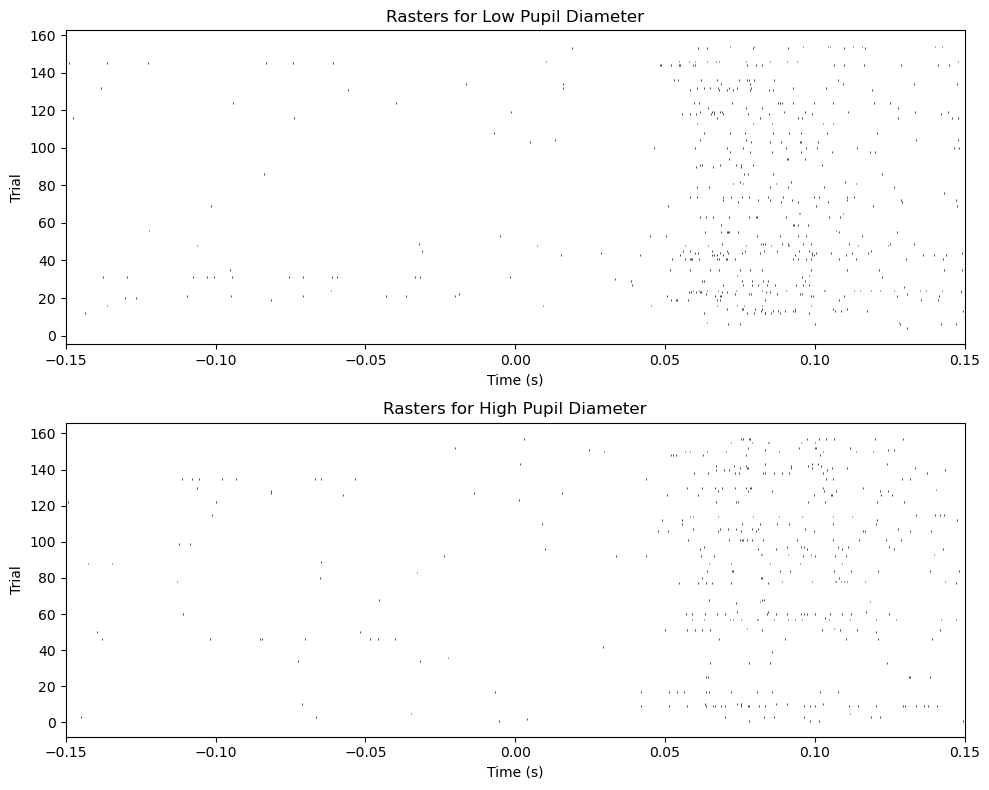

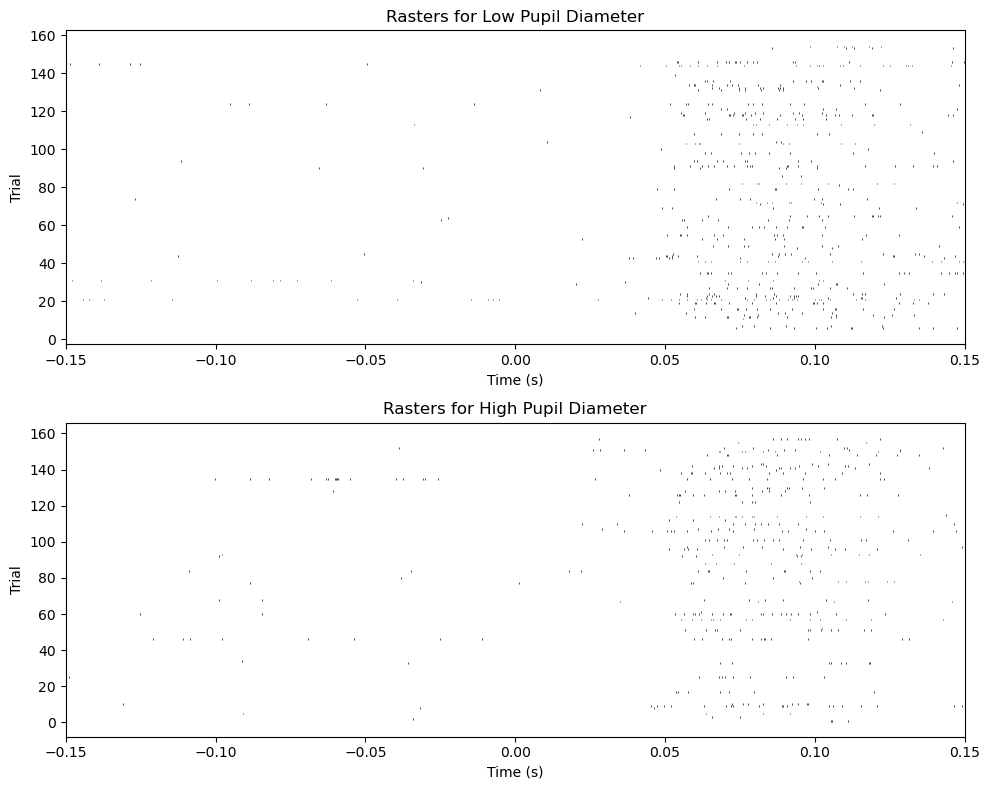

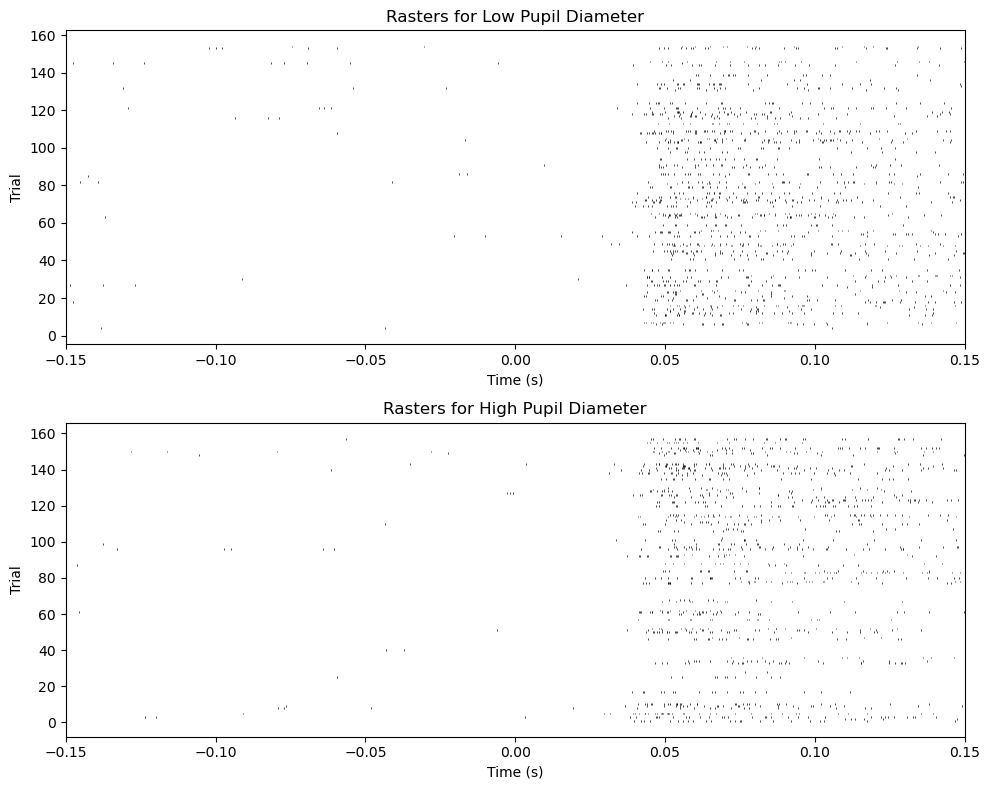

In [ ]:
from utils import utils
from lib import readSGLX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import scipy.stats as stats
from utils import utils as ut
from scipy.signal import detrend

# Load data
spike_times_secpath = utils.getFilePath(windowTitle="Spike_times", filetypes=[('Spike times numpy file', '*.npy')])
clusters_path = utils.getFilePath(windowTitle="Select_clusters", filetypes=[('Clusters numpy file', '*.npy')])
stimulus_DF_path = utils.getFilePath(windowTitle="stimstart", filetypes=[('stimulus csv file', '*.csv')])
trial_DF_path = utils.getFilePath(windowTitle="trialstart", filetypes=[('trial csv file', '*.csv')])

spike_times_sec = np.load(spike_times_secpath)
clusters = np.load(clusters_path)
stimulusDF = pd.read_csv(stimulus_DF_path)
trialDF = pd.read_csv(trial_DF_path)

binFullPath = ut.getFilePath(windowTitle="Binary nidq file", filetypes=[("NIdq binary", "*.bin")])
meta = readSGLX.readMeta(binFullPath)
sRate = readSGLX.SampRate(meta)
pupilFullPath = ut.getFilePath(windowTitle="Pupil diameter data", filetypes=[("Numpy array", "*.npy")])

spike_times_clusters = utils.get_spike_times(clusters, spike_times_sec)

def plot_raster(Y, cluster_index, ax, stimulusDF, title):
    for trial, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time - 0.15) & (Y <= stop_time)]
        ax.eventplot(spikes_in_trial - start_time, color='black', linewidths=0.5, lineoffsets=trial + 1)
    ax.set_title(title)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Trial')
    ax.set_xlim(-0.15, 0.15)

def calculate_mean_firing_rate(Y, trialDF, i, yesplot=False, pdfname=None):
    spike_counts = []  
    if yesplot:
        fig, ax = plt.subplots()
    for index, row in trialDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.03) & (Y <= stop_time)]
        spike_count_trial = len(spikes_in_trial)
        spike_counts.append(spike_count_trial)
        baseline_start = start_time - 0.2
        baseline_end = start_time
        trialDF.at[index, f'baseline_spike_count_cluster_{i}'] = len(spikes_in_trial)
        trialDF.at[index, f'baseline_firing_rate_cluster_{i}'] = len(spikes_in_trial) / (baseline_end - baseline_start) if baseline_end > baseline_start else 0
    if yesplot:
        plt.show()
    return trialDF

def get_spike_counts(Y, stimulusDF):
    spkC_evk = np.NaN * np.ones(len(stimulusDF))
    spkC_bsl = np.NaN * np.ones(len(stimulusDF))
    for index, row in stimulusDF.iterrows():
        start_time = row['stimstart']
        stop_time = row['stimstop']
        spikes_in_trial = Y[(Y >= start_time + 0.035) & (Y <= stop_time)]
        spikes_in_bsl = Y[(Y >= start_time - 0.15 + 0.035) & (Y <= start_time)]
        spkC_evk[index] = len(spikes_in_trial)
        spkC_bsl[index] = len(spikes_in_bsl)
    return spkC_evk, spkC_bsl

def calculate_median_pupil_diameter(pupil_diameter, stimulusDF, baseline_time, sample_rate):
    medians = []
    for index, row in stimulusDF.iterrows():
        start_sample = int((row['stimstart'] - baseline_time) * sample_rate)
        stop_sample = int(row['stimstop'] * sample_rate)
        trial_data = pupil_diameter[start_sample:stop_sample]
        median_diameter = np.median(trial_data)
        medians.append(median_diameter)
    return np.array(medians)

spkC = {}
BSL = {}
spkC_zscored = {}
good_clusters = []
for i in spike_times_clusters.keys():
    Y = spike_times_clusters[i]
    spkC[i], BSL[i] = get_spike_counts(Y, stimulusDF)
    res = stats.ttest_rel(spkC[i], BSL[i])
    if np.mean(spkC[i]) > np.mean(BSL[i]) + 3:
        good_clusters.append(i)
        spkC_zscored[i] = stats.zscore(spkC[i])

pupil_diameter = np.load(pupilFullPath)
pupil_diameter = detrend(pupil_diameter)
pupil_diameter = pupil_diameter - np.nanmin(pupil_diameter)
pupil_diameter = pupil_diameter / np.nanmax(pupil_diameter)
pupil_trials = calculate_median_pupil_diameter(pupil_diameter, stimulusDF, 0.15, sRate)

spkC_low = []
spkC_high = []
pup_median = np.median(pupil_trials)
inds_low = np.where(pupil_trials < pup_median)[0]
inds_high = np.where(pupil_trials > pup_median)[0]
for c in good_clusters:
    spkC_low.append(spkC[c][inds_low])
    spkC_high.append(spkC[c][inds_high])

spkC_low = np.array(spkC_low)
spkC_high = np.array(spkC_high)

#  (AMI)
ami = np.mean(spkC_high) / np.mean(spkC_low)
print(f"Arousal Modulation Index (AMI): {ami}")

# bootstrapping 
def bootstrap_ami(spkC_low, spkC_high, n_bootstrap=10000):
    ami_bootstrap = []
    combined_data = np.concatenate([spkC_low.flatten(), spkC_high.flatten()])
    for _ in range(n_bootstrap):
        low_sample = np.random.choice(combined_data, size=spkC_low.size, replace=True)
        high_sample = np.random.choice(combined_data, size=spkC_high.size, replace=True)
        ami_bootstrap.append(np.mean(high_sample) / np.mean(low_sample))
    return ami_bootstrap

ami_bootstrap = bootstrap_ami(spkC_low, spkC_high)
p_value = np.sum(np.array(ami_bootstrap) >= ami) / len(ami_bootstrap)
print(f"Bootstrap p-value: {p_value}")

# Plot AMI 
spkC_low = spkC_low / (0.15 - 0.035)
mnLow = np.mean(spkC_low)
spkC_high = spkC_high / (0.15 - 0.035)
mnHig = np.mean(spkC_high)
SELow = np.std(spkC_low) / np.sqrt(len(spkC_low.flatten()))
SEHig = np.std(spkC_high) / np.sqrt(len(spkC_high.flatten()))

fig, ax = plt.subplots()
ax.bar([1, 2], [mnLow, mnHig], yerr=[SELow, SEHig])
ax.set_xticks([1, 2])
ax.set_xticklabels(['Low arousal', 'High arousal'])
ax.set_title(f'Arousal Modulation Index: {ami:.2f}, p-value: {p_value:.4f}')
plt.show()

# rasters for low and high arousal states
for c in good_clusters:
    Y = spike_times_clusters[c]
    fig, axs = plt.subplots(2, 1, figsize=(10, 8))
    plot_raster(Y, c, axs[0], stimulusDF.iloc[inds_low], title='Low arousal')
    plot_raster(Y, c, axs[1], stimulusDF.iloc[inds_high], title='High arousal')
    plt.tight_layout()
    plt.show()

#  rasters by pupil diameter
# Rasters organized by pupil diameter for high and low arousal
for c in good_clusters:
    Y = spike_times_clusters[c]
    sorted_indices = np.argsort(pupil_trials)
    sorted_stimulusDF = stimulusDF.iloc[sorted_indices]
    fig, axs = plt.subplots(2, 1, figsize=(10, 8))
    plot_raster(Y, c, axs[0], sorted_stimulusDF.iloc[inds_low], title='Rasters for Low Pupil Diameter')
    plot_raster(Y, c, axs[1], sorted_stimulusDF.iloc[inds_high], title='Rasters for High Pupil Diameter')
    plt.tight_layout()
    plt.show()